# 1. Setup

In [97]:
!pip uninstall umap

In [98]:
!pip install umap-learn
!pip show umap-learn


Name: umap-learn
Version: 0.5.7
Summary: Uniform Manifold Approximation and Projection
Home-page: http://github.com/lmcinnes/umap
Author: 
Author-email: 
License: BSD
Location: /Users/mac/miniconda3/envs/skl_extra_py311/lib/python3.11/site-packages
Requires: numba, numpy, pynndescent, scikit-learn, scipy, tqdm
Required-by: 


In [99]:
import warnings
warnings.filterwarnings("ignore")

In [100]:
# Setup imports

import os
import glob
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.cluster import KMeans
from clustering_algorithms.clusterer import get_clusterer

from utils.fingerprint_transformer import FingerprintTransformer, smiles_to_fingerprints
from utils import create_tsne, create_umap

%matplotlib inline

sns.set_theme(style="whitegrid")


# 2. Load Data

In [104]:
data_dir = "data/cleaned_data"
dataset_files = sorted(glob.glob(os.path.join(data_dir, "*.csv")))

print(f"Found {len(dataset_files)} datasets")

def load_smiles_and_labels(csv_path):
    df = pd.read_csv(csv_path).dropna(subset=["Smiles", "Standard Value"])
    smiles = df["Smiles"].tolist()
    labels = df["Standard Value"].astype(float).tolist()
    return smiles, labels


Found 10 datasets


# 3. Clustering

In [105]:
def run_clustering(
    smiles_list,
    clusterer_names=None,
    n_clusters=5,
    fp_type="morgan",
    random_state=42,
    neighbor_k=5,
    min_shared=3
):
    if clusterer_names is None:
        clusterer_names = [
            "scaffold",
            "jarvis-patrick",
            "kmedoids",
            "maxmin",
            "butina",
            "birch"
        ]

    results = {}
    for name in clusterer_names:
        print(f"Running clustering: {name}")
        pipeline = get_clusterer(
            name=name,
            n_clusters=n_clusters,
            random_state=random_state,
            fp_type=fp_type,
            neighbor_k=neighbor_k,
            min_shared=min_shared
        )
        try:
            if hasattr(pipeline, "fit_predict"):
                labels = pipeline.fit_predict(smiles_list)
            else:
                pipeline.fit(smiles_list)
                if hasattr(pipeline, "predict"):
                    labels = pipeline.predict(smiles_list)
                else:
                    labels = pipeline.named_steps["clusterer"].get_labels()
            results[name] = labels
        except Exception as e:
            print(f"Failed clustering {name}: {e}")
            results[name] = None
    return results


from sklearn.metrics import (
    silhouette_score,
    adjusted_rand_score,
    mutual_info_score,
    normalized_mutual_info_score,
    homogeneity_score,
    completeness_score,
    v_measure_score
)
import pandas as pd
import numpy as np

def evaluate_clustering(csv_path, predicted_labels, metric, feature_matrix=None):
    df = pd.read_csv(csv_path)
    if "Standard Value" not in df.columns:
        raise ValueError("CSV must contain 'Standard Value' column for evaluation.")

    true_labels = df["Standard Value"].astype(float).values

    mask = ~np.isnan(true_labels)
    true_labels = true_labels[mask]
    predicted_labels = np.array(predicted_labels)[mask]

    if feature_matrix is not None:
        feature_matrix = np.array(feature_matrix)[mask]

    if metric == "silhouette_score":
        if feature_matrix is None:
            raise ValueError("feature_matrix is required for silhouette_score.")
        if len(set(predicted_labels)) < 2:
            return float("nan")  # Silhouette undefined for single cluster
        return silhouette_score(feature_matrix, predicted_labels)
    elif metric == "adjusted_rand_score":
        return adjusted_rand_score(true_labels, predicted_labels)
    elif metric == "mutual_info_score":
        return mutual_info_score(true_labels, predicted_labels)
    elif metric == "normalized_mutual_info_score":
        return normalized_mutual_info_score(true_labels, predicted_labels)
    elif metric == "homogeneity_score":
        return homogeneity_score(true_labels, predicted_labels)
    elif metric == "completeness_score":
        return completeness_score(true_labels, predicted_labels)
    elif metric == "v_measure_score":
        return v_measure_score(true_labels, predicted_labels)
    else:
        raise ValueError(f"Unsupported metric: {metric}")



# 4. Run Clustering


=== Processing dataset: data/cleaned_data/5-HT1A.csv ===
Running clustering: scaffold
Running clustering: jarvis-patrick
Running clustering: kmedoids
Running clustering: maxmin
Running clustering: butina
Running clustering: birch

Evaluating clustering with algorithm: scaffold
silhouette_score: 0.1431
adjusted_rand_score: 0.0244
mutual_info_score: 5.4058
normalized_mutual_info_score: 0.7787
homogeneity_score: 0.7692
completeness_score: 0.7884
v_measure_score: 0.7787
silhouette_score: 0.1431
t-SNE plot saved to TSNE_plots/tsne_5-HT1A_scaffold.png


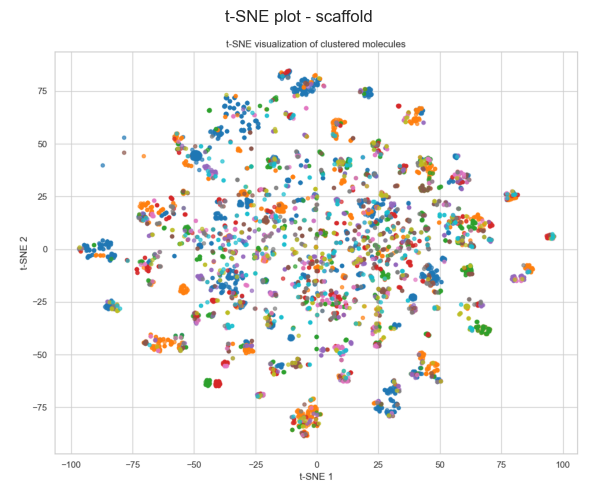

UMAP plot saved to UMAP_plots/umap_5-HT1A_scaffold.png


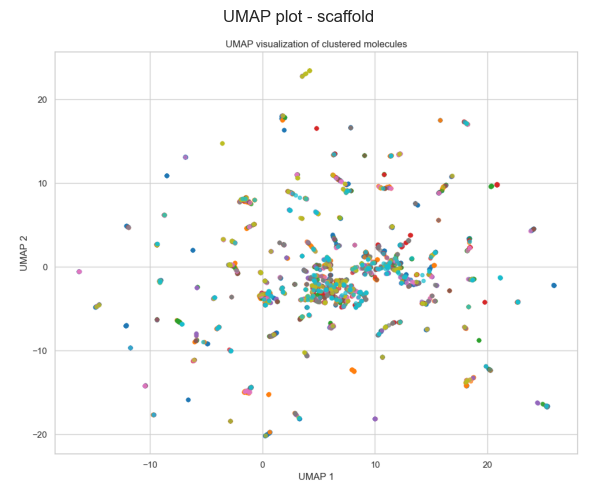


Evaluating clustering with algorithm: jarvis-patrick
silhouette_score: 0.2269
adjusted_rand_score: 0.0183
mutual_info_score: 6.3405
normalized_mutual_info_score: 0.8499
homogeneity_score: 0.9023
completeness_score: 0.8034
v_measure_score: 0.8499
silhouette_score: 0.2269
t-SNE plot saved to TSNE_plots/tsne_5-HT1A_jarvis-patrick.png


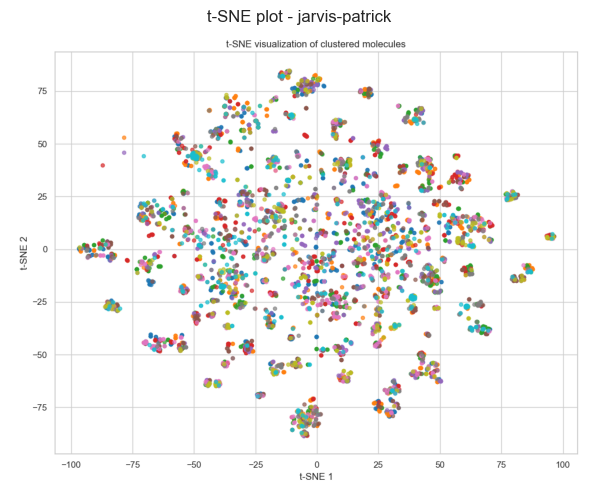

UMAP plot saved to UMAP_plots/umap_5-HT1A_jarvis-patrick.png


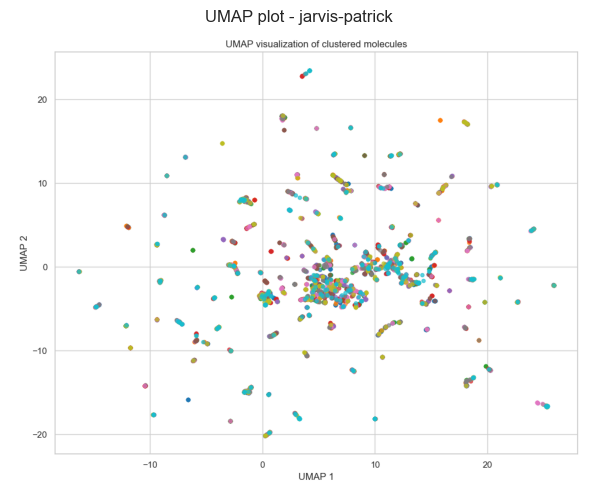


Evaluating clustering with algorithm: kmedoids
silhouette_score: -0.1062
adjusted_rand_score: 0.0005
mutual_info_score: 0.5084
normalized_mutual_info_score: 0.1252
homogeneity_score: 0.0723
completeness_score: 0.4637
v_measure_score: 0.1252
silhouette_score: -0.1062
t-SNE plot saved to TSNE_plots/tsne_5-HT1A_kmedoids.png


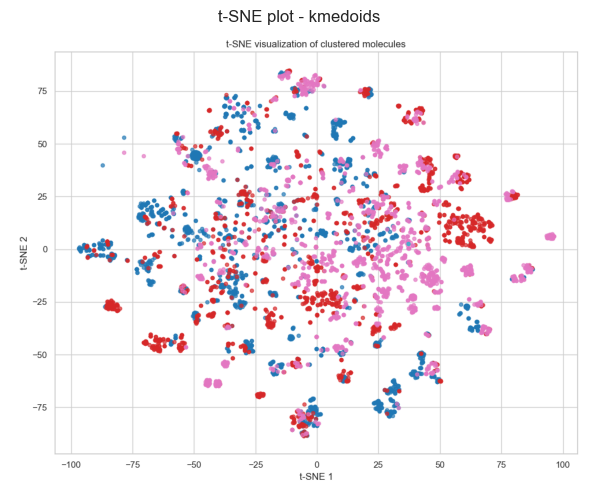

UMAP plot saved to UMAP_plots/umap_5-HT1A_kmedoids.png


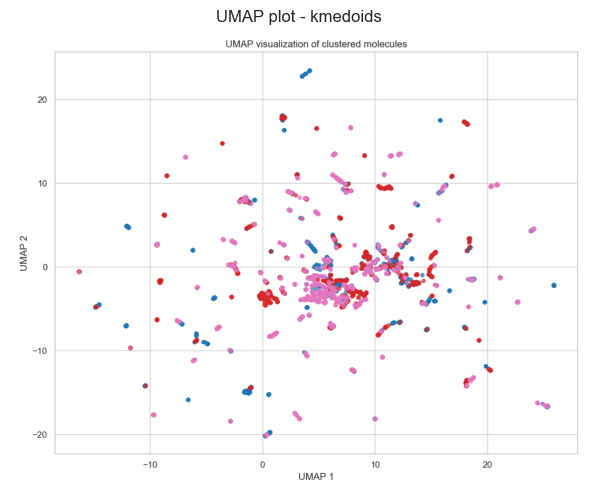


Evaluating clustering with algorithm: maxmin
silhouette_score: -0.0119
adjusted_rand_score: 0.0000
mutual_info_score: 0.5304
normalized_mutual_info_score: 0.1303
homogeneity_score: 0.0755
completeness_score: 0.4764
v_measure_score: 0.1303
silhouette_score: -0.0119
t-SNE plot saved to TSNE_plots/tsne_5-HT1A_maxmin.png


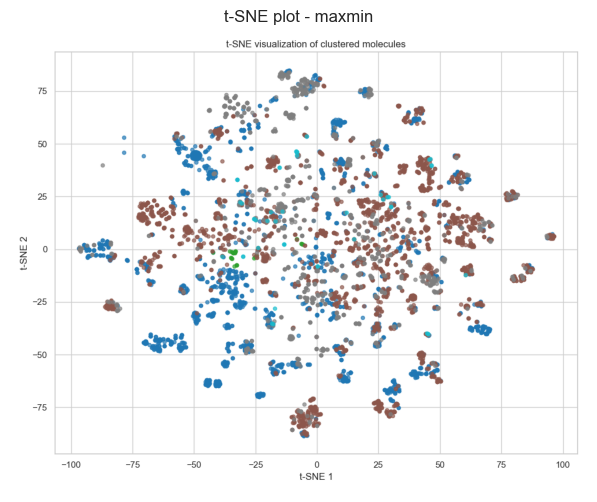

UMAP plot saved to UMAP_plots/umap_5-HT1A_maxmin.png


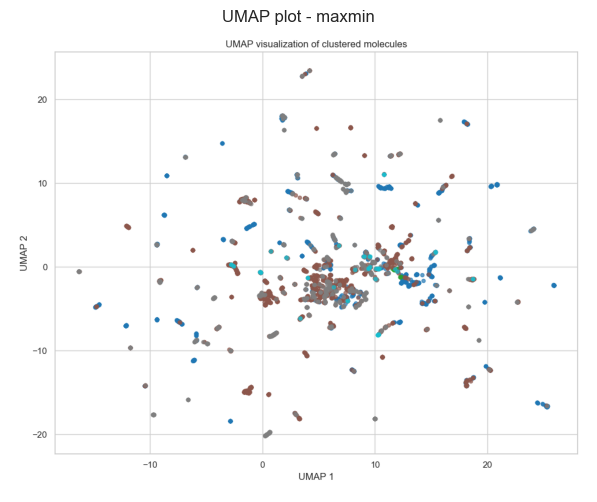


Evaluating clustering with algorithm: butina
silhouette_score: 0.2699
adjusted_rand_score: 0.0323
mutual_info_score: 5.2237
normalized_mutual_info_score: 0.7636
homogeneity_score: 0.7433
completeness_score: 0.7851
v_measure_score: 0.7636
silhouette_score: 0.2699
t-SNE plot saved to TSNE_plots/tsne_5-HT1A_butina.png


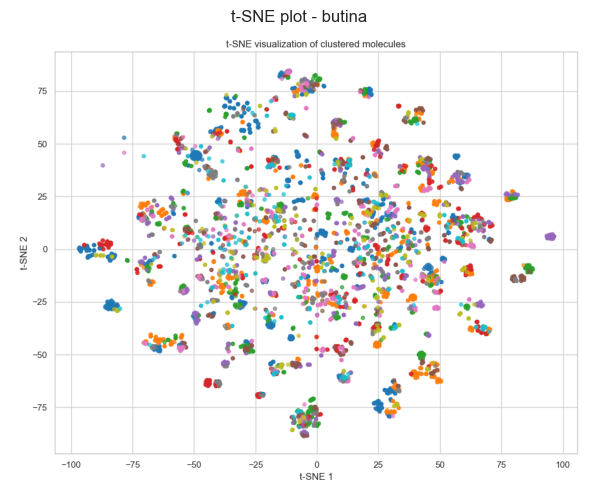

UMAP plot saved to UMAP_plots/umap_5-HT1A_butina.png


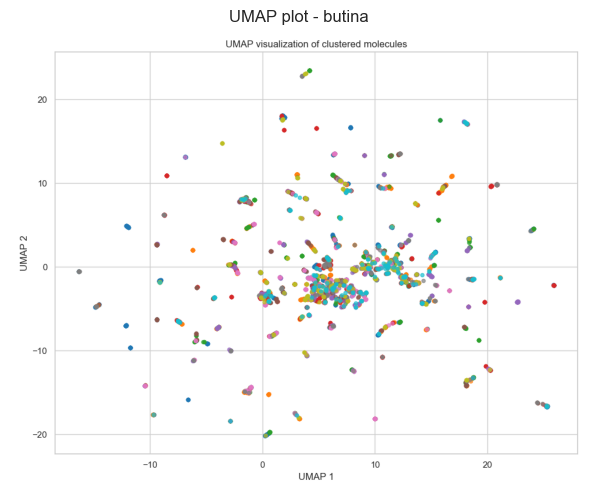


Evaluating clustering with algorithm: birch
silhouette_score: 0.0535
adjusted_rand_score: 0.0019
mutual_info_score: 0.6993
normalized_mutual_info_score: 0.1689
homogeneity_score: 0.0995
completeness_score: 0.5587
v_measure_score: 0.1689
silhouette_score: 0.0535
t-SNE plot saved to TSNE_plots/tsne_5-HT1A_birch.png


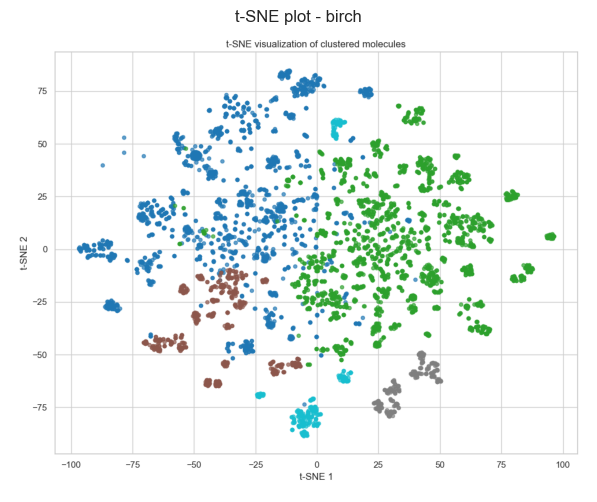

UMAP plot saved to UMAP_plots/umap_5-HT1A_birch.png


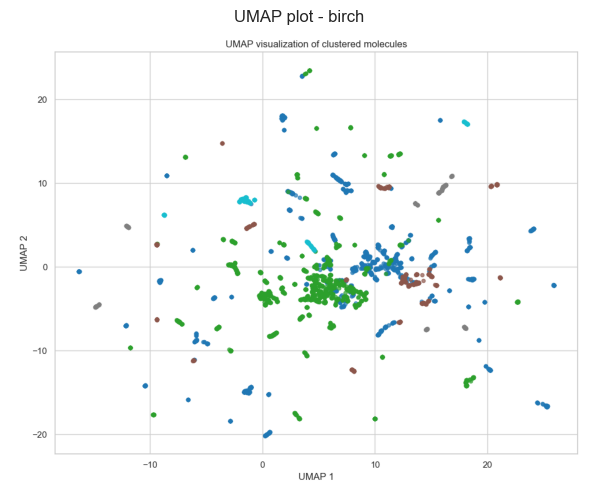


Cluster 0 dominant scaffolds:
  c1ccc2c(c1)C[C@@H]1CCN[C@@H]1C2: 1 compounds
  c1ccc2c(c1)CC1CCN[C@@H]1C2: 1 compounds
  c1ccc2c(c1)CC1CCNC1C2: 1 compounds

Cluster 1 dominant scaffolds:
  c1ccc2c(c1)CC[C@H]1NCC[C@@H]21: 1 compounds
  c1ccc2c(c1)CC[C@H]1NCCC21: 1 compounds
  c1ccc2c(c1)CC[C@H]1NCC[C@@H]21: 1 compounds

Cluster 2 dominant scaffolds:
  c1ccc2c(c1)C[C@H]1CCN(CC3CC3)[C@@H]1C2: 1 compounds
  c1ccc2c(c1)C[C@H]1CCN(CC3CC3)[C@@H]1C2: 1 compounds
  c1ccc2c(c1)C[C@H]1CCN(CC3CC3)[C@H]1C2: 1 compounds

Cluster 3 dominant scaffolds:
  c1ccc2sc(C3CCN(CCCOc4cccc5[nH]ccc45)CC3)cc2c1: 1 compounds
  c1ccc2sc(C3CCN(CCCOc4cccc5[nH]ccc45)CC3)cc2c1: 1 compounds
  c1ccc2sc(C3CCN(CCCOc4cccc5[nH]ccc45)CC3)cc2c1: 1 compounds

Cluster 4 dominant scaffolds:
  O=C(Nc1ccc2[nH]cc(C3CCNCC3)c2n1)c1ccccc1: 1 compounds
  O=C(Nc1ccc2[nH]cc(C3CCNCC3)c2n1)c1ccccc1: 1 compounds
  O=C(Nc1ccc2[nH]cc(C3CCNCC3)c2n1)c1ccccc1: 1 compounds

Cluster 5 dominant scaffolds:
  c1ccc(CCN2CCN(c3ccccc3)CC2)cc1: 1 compoun

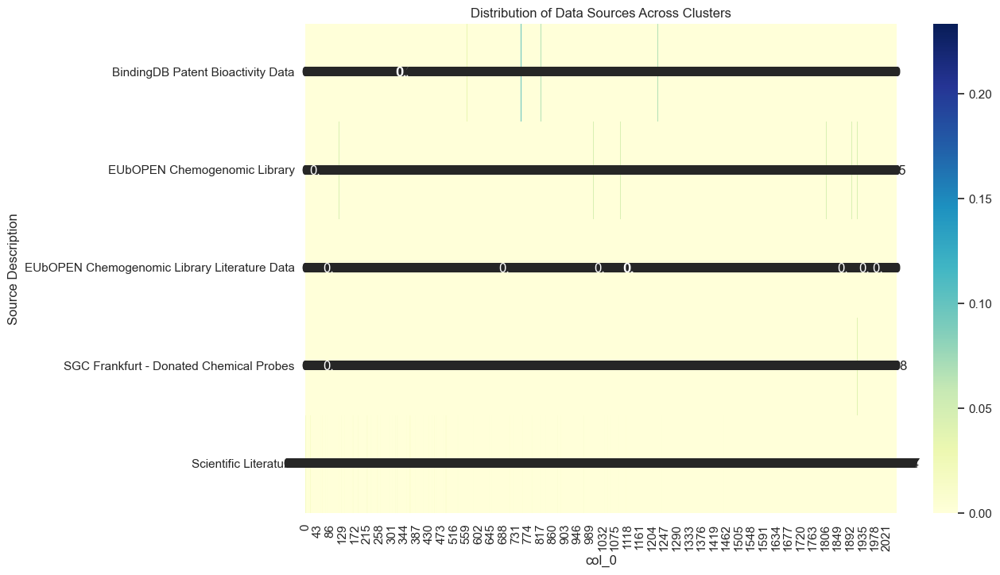

Chi-square test p-value: 0.0000
Significant correlation between clusters and data sources

Average standard deviation per cluster:
Cluster
0       913.570312
1       291.086673
2       388.494530
3         9.898558
4        41.011365
           ...    
2049           NaN
2050     12.020815
2051           NaN
2052           NaN
2053           NaN
Name: std, Length: 2054, dtype: float64


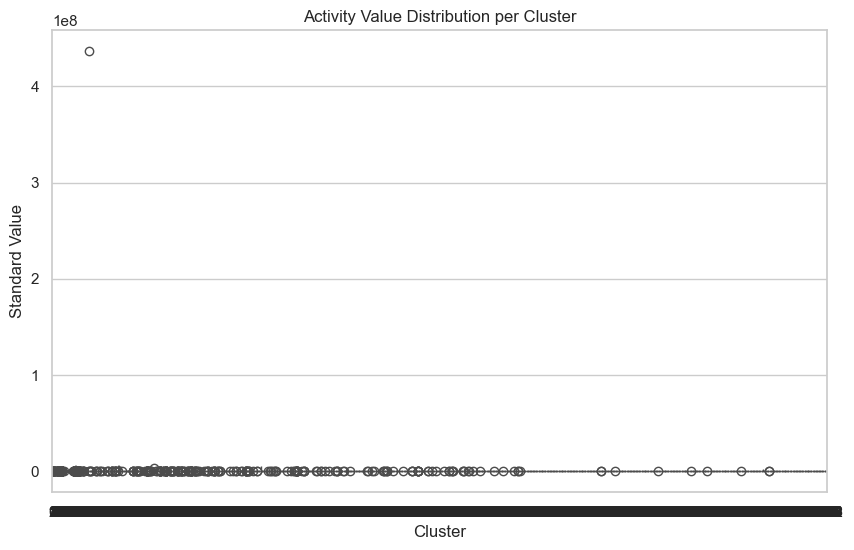


Compounds with high assay variance (>1.0):
                                                Smiles       std_dev
2                     C1=C(CCN2CCc3ccccc3C2)Cc2ccccc21  8.852977e+00
4                    C=CCN(CC=C)CCc1c[nH]c2ccc(Br)cc12  7.063997e+03
5                     C=CCN(CC=C)CCc1c[nH]c2ccc(C)cc12  7.048709e+03
6                    C=CCN(CC=C)CCc1c[nH]c2ccc(Cl)cc12  7.029433e+03
7                     C=CCN(CC=C)CCc1c[nH]c2ccc(F)cc12  7.014902e+03
..                                                 ...           ...
527  O[C@H](COc1cccc2[nH]ccc12)CN1[C@@H]2CC[C@H]1C[...  2.795193e+01
530  [N-]=[N+]=Nc1ccc(CCN2CCN(c3cccc(C(F)(F)F)c3)CC...  1.979899e+00
532                     c1cc(OCCCNC2CCCC2)c2cc[nH]c2c1  9.807571e+01
538              c1ccc(N2CCN(Cc3nc4ccccc4[nH]3)CC2)nc1  1.958686e+06
550             c1ccc2c(c1)CCN(CCCCc1c[nH]c3ccccc13)C2  6.533667e+00

[219 rows x 2 columns]


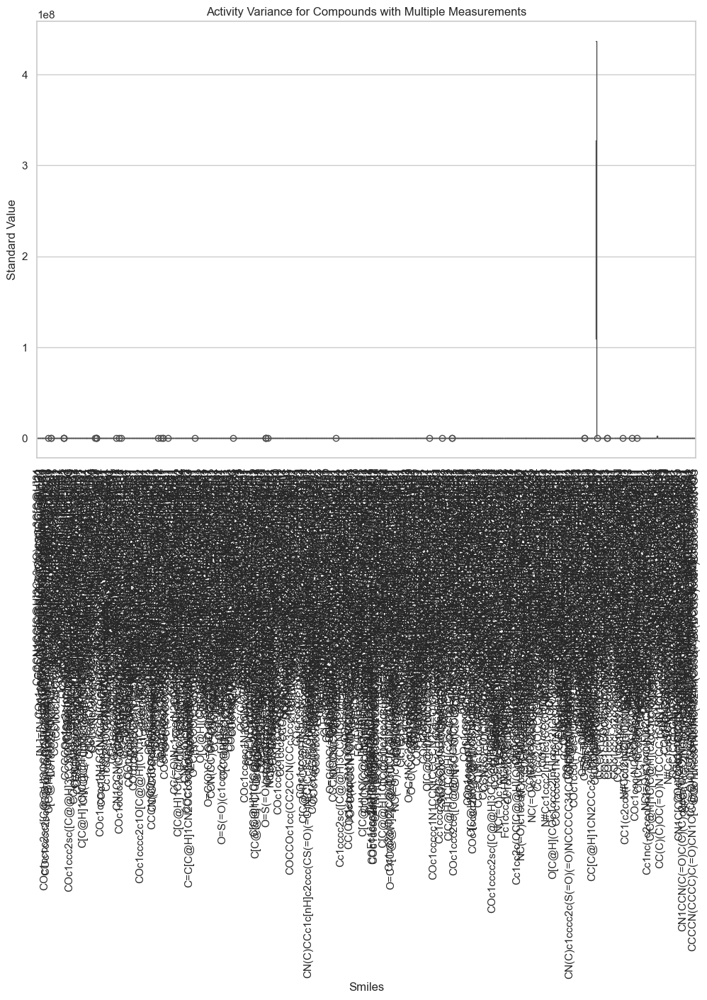


=== Processing dataset: data/cleaned_data/5-HT1B.csv ===
Running clustering: scaffold
Running clustering: jarvis-patrick
Running clustering: kmedoids
Running clustering: maxmin
Running clustering: butina
Running clustering: birch

Evaluating clustering with algorithm: scaffold
silhouette_score: 0.1010
adjusted_rand_score: 0.0282
mutual_info_score: 4.1750
normalized_mutual_info_score: 0.7599
homogeneity_score: 0.7729
completeness_score: 0.7474
v_measure_score: 0.7599
silhouette_score: 0.1010
t-SNE plot saved to TSNE_plots/tsne_5-HT1B_scaffold.png


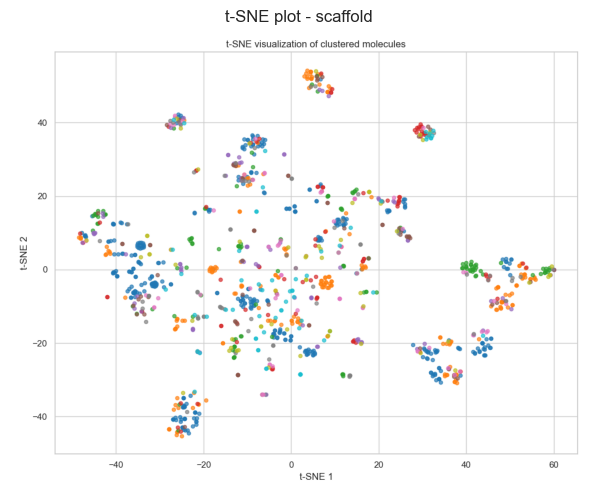

UMAP plot saved to UMAP_plots/umap_5-HT1B_scaffold.png


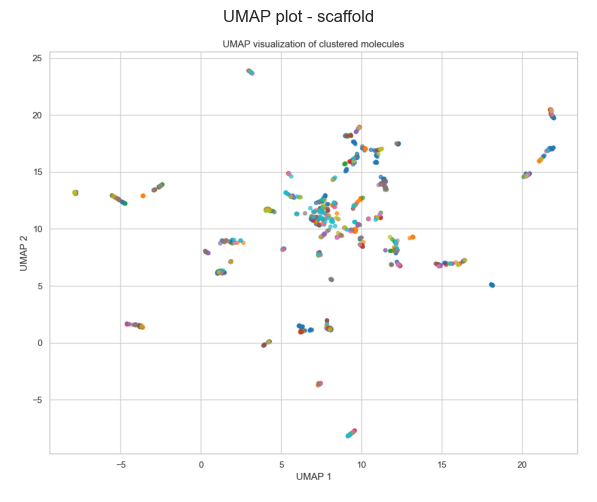


Evaluating clustering with algorithm: jarvis-patrick
silhouette_score: 0.1984
adjusted_rand_score: 0.0208
mutual_info_score: 4.7331
normalized_mutual_info_score: 0.8113
homogeneity_score: 0.8762
completeness_score: 0.7554
v_measure_score: 0.8113
silhouette_score: 0.1984
t-SNE plot saved to TSNE_plots/tsne_5-HT1B_jarvis-patrick.png


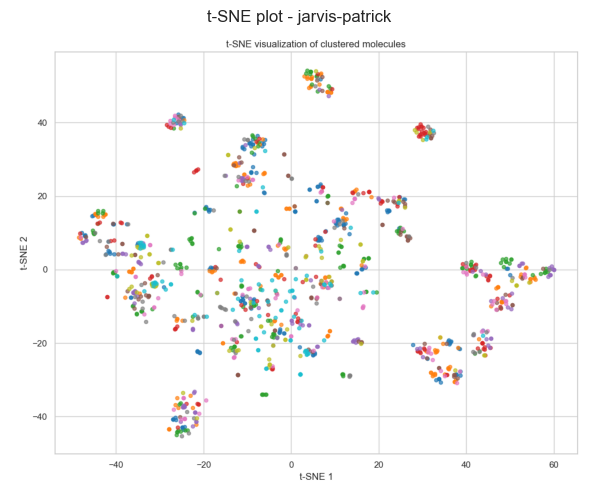

UMAP plot saved to UMAP_plots/umap_5-HT1B_jarvis-patrick.png


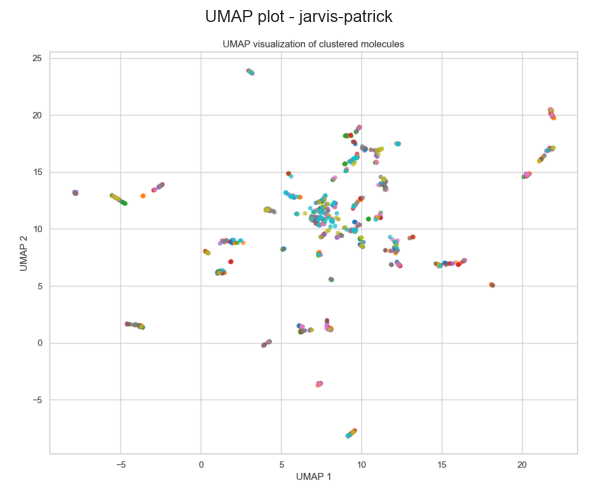


Evaluating clustering with algorithm: kmedoids
silhouette_score: 0.0372
adjusted_rand_score: 0.0077
mutual_info_score: 0.9053
normalized_mutual_info_score: 0.2597
homogeneity_score: 0.1676
completeness_score: 0.5768
v_measure_score: 0.2597
silhouette_score: 0.0372
t-SNE plot saved to TSNE_plots/tsne_5-HT1B_kmedoids.png


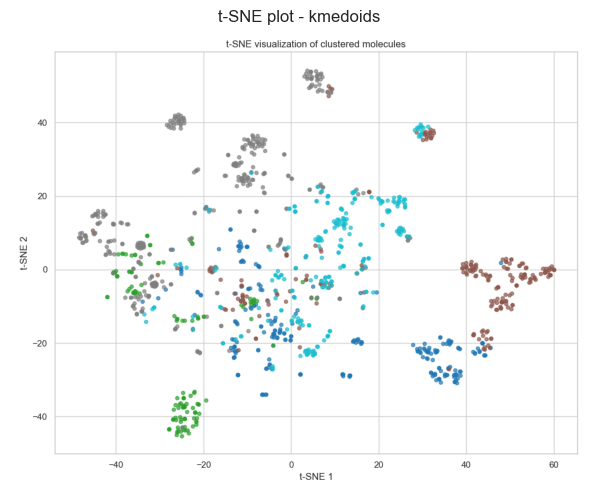

UMAP plot saved to UMAP_plots/umap_5-HT1B_kmedoids.png


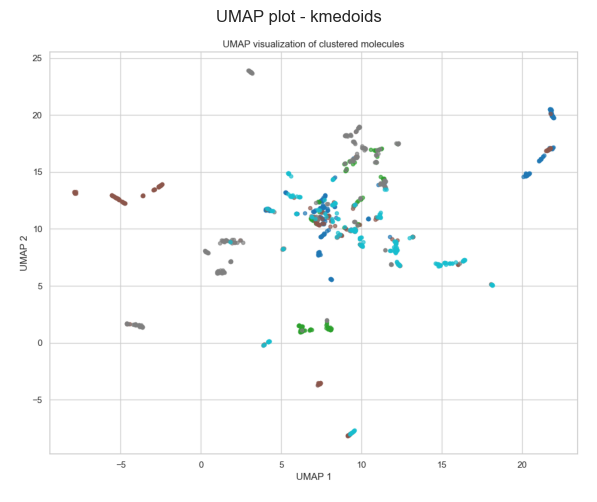


Evaluating clustering with algorithm: maxmin
silhouette_score: 0.0138
adjusted_rand_score: -0.0060
mutual_info_score: 0.6460
normalized_mutual_info_score: 0.1962
homogeneity_score: 0.1196
completeness_score: 0.5456
v_measure_score: 0.1962
silhouette_score: 0.0138
t-SNE plot saved to TSNE_plots/tsne_5-HT1B_maxmin.png


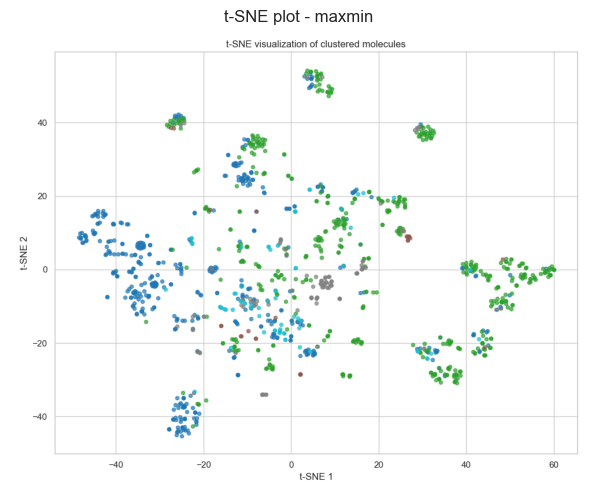

UMAP plot saved to UMAP_plots/umap_5-HT1B_maxmin.png


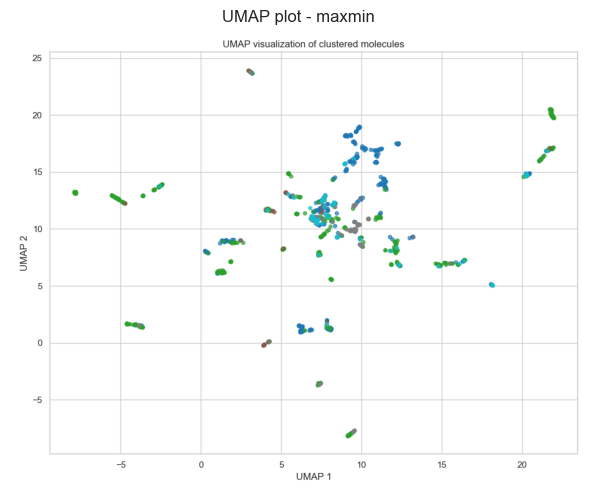


Evaluating clustering with algorithm: butina
silhouette_score: 0.2496
adjusted_rand_score: 0.0392
mutual_info_score: 3.9866
normalized_mutual_info_score: 0.7414
homogeneity_score: 0.7380
completeness_score: 0.7448
v_measure_score: 0.7414
silhouette_score: 0.2496
t-SNE plot saved to TSNE_plots/tsne_5-HT1B_butina.png


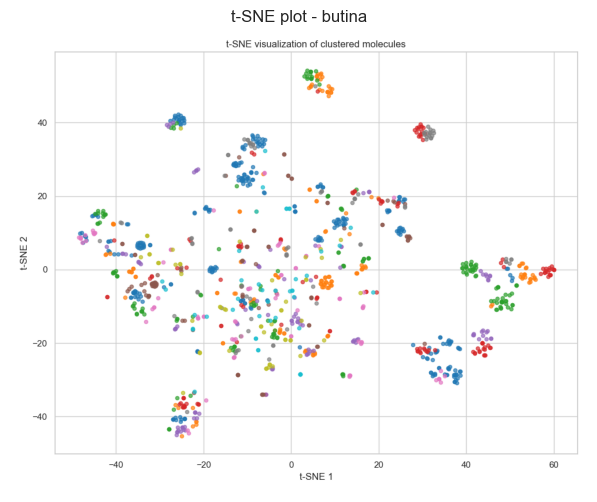

UMAP plot saved to UMAP_plots/umap_5-HT1B_butina.png


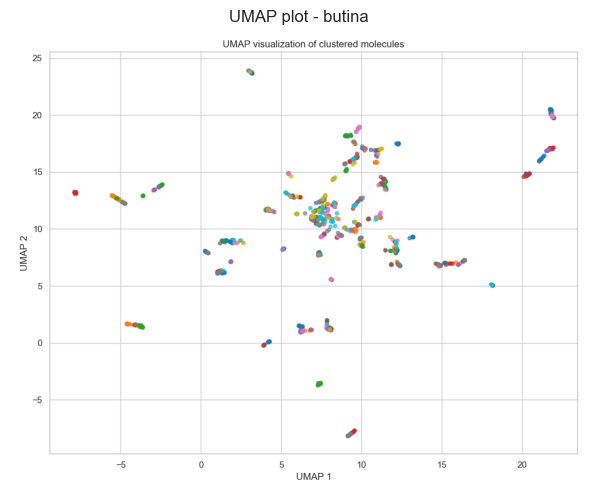


Evaluating clustering with algorithm: birch
silhouette_score: 0.0893
adjusted_rand_score: 0.0479
mutual_info_score: 0.8933
normalized_mutual_info_score: 0.2682
homogeneity_score: 0.1654
completeness_score: 0.7093
v_measure_score: 0.2682
silhouette_score: 0.0893
t-SNE plot saved to TSNE_plots/tsne_5-HT1B_birch.png


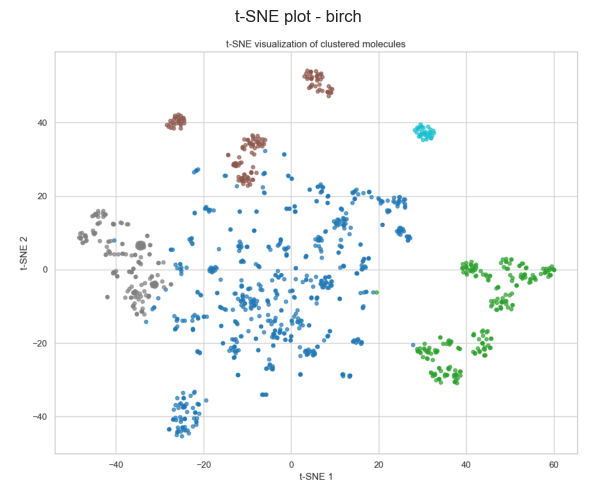

UMAP plot saved to UMAP_plots/umap_5-HT1B_birch.png


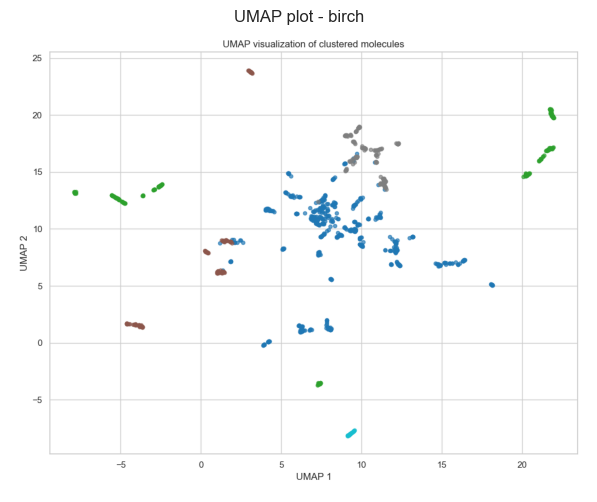


Cluster 0 dominant scaffolds:
  O=C(Nc1ccc2[nH]cc(C3CCNCC3)c2n1)c1ccccc1: 1 compounds
  O=C(Nc1ccc2[nH]cc(C3CCNCC3)c2n1)c1ccccc1: 1 compounds
  O=C(Nc1ccc2[nH]cc(C3CCNCC3)c2n1)c1ccccc1: 1 compounds

Cluster 1 dominant scaffolds:
  c1cnc2c(C3CCNCC3)c[nH]c2c1: 1 compounds
  c1cnc2c(C3CCNCC3)c[nH]c2c1: 1 compounds
  c1cnc2c(C3CCNCC3)c[nH]c2c1: 1 compounds

Cluster 2 dominant scaffolds:
  O=C(Nc1cccc2[nH]ccc12)c1ccccc1: 1 compounds

Cluster 3 dominant scaffolds:
  O=C(Nc1ccc2[nH]cc(C3CCNCC3)c2n1)c1ccco1: 1 compounds

Cluster 4 dominant scaffolds:
  O=C(/C=C/c1ccccc1)N[C@H]1CC[C@H](CCN2CCc3ccccc3C2)CC1: 1 compounds
  O=C(/C=C/c1ccccc1)N[C@H]1CC[C@H](CCN2CCc3ccccc3C2)CC1: 1 compounds
  O=C(/C=C/c1ccccc1)N[C@H]1CC[C@H](CCN2CCc3ccccc3C2)CC1: 1 compounds

Cluster 5 dominant scaffolds:
  c1ccc2[nH]ccc2c1: 1 compounds
  c1ccc2[nH]ccc2c1: 1 compounds
  c1ccc2[nH]ccc2c1: 1 compounds

Cluster 6 dominant scaffolds:
  O=C(Nc1ccc(N2CCOCC2)cc1)c1cc(=O)c2cccc(NC3CCNC3)c2[nH]1: 1 compounds
  O=C(Nc1ccc(N

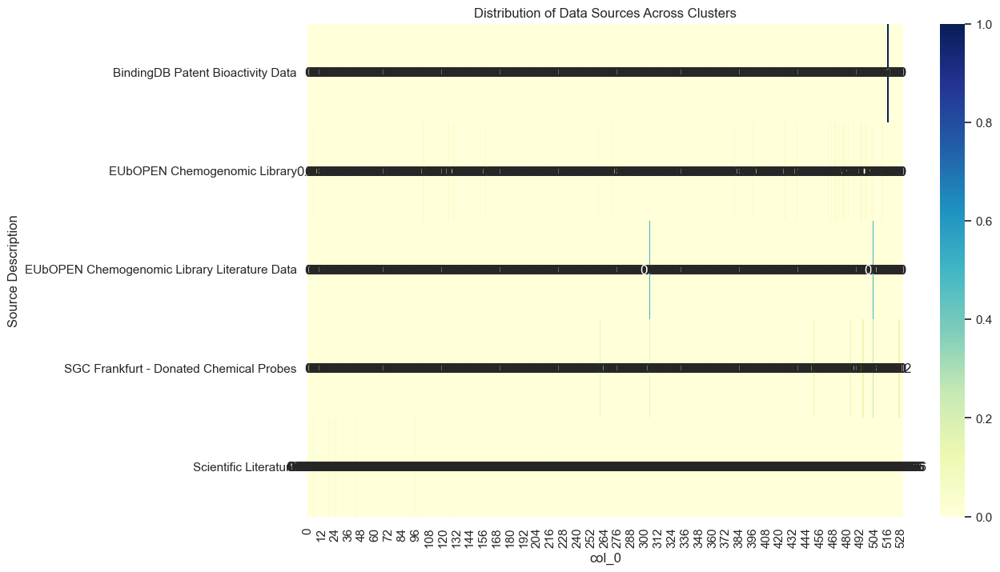

Chi-square test p-value: 0.0000
Significant correlation between clusters and data sources

Average standard deviation per cluster:
Cluster
0       479.207679
1       188.614547
2              NaN
3              NaN
4      4638.696391
          ...     
525            NaN
526      57.077659
527            NaN
528            NaN
529            NaN
Name: std, Length: 530, dtype: float64


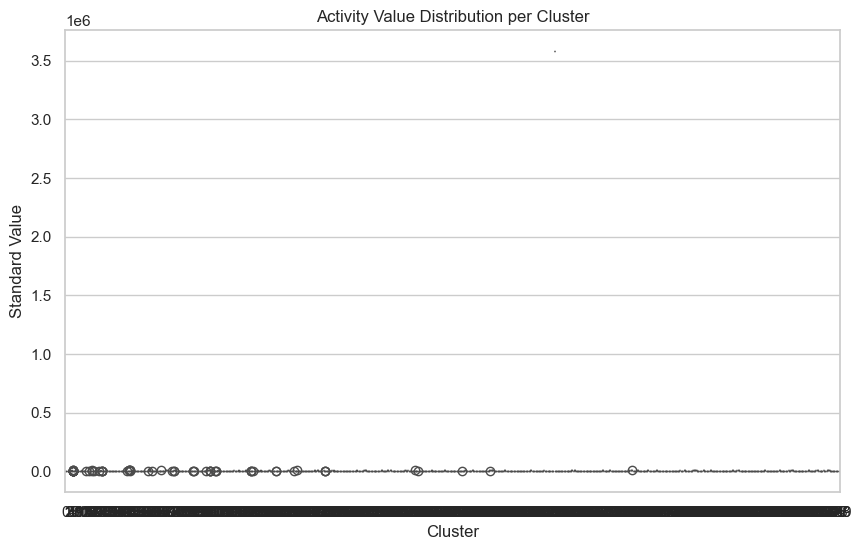


Compounds with high assay variance (>1.0):
                                               Smiles      std_dev
0                   C=CCN(CC=C)CCc1c[nH]c2ccc(OC)cc12   353.569316
1                CC(=O)Nc1ccc2[nH]cc(C3CCN(C)CC3)c2n1    21.213203
2   CC(C)(C)OC(=O)N1CCCC1CNC1CCC(c2cc(F)ccc2F)(S(=...    31.176915
3                       CC(C)NCC(O)COc1cccc2[nH]ccc12  5232.590181
4                              CC(N)Cc1c[nH]c2ccccc12    40.877843
6        CC1CCN(CC[C@H]2CCCN2S(=O)(=O)c2cccc(O)c2)CC1  6363.961031
8               CCC(=O)Nc1ccc2[nH]cc(C3CCN(C)CC3)c2n1   296.984848
9                      CCCCCCCCOc1ccc2[nH]cc(CCN)c2c1     1.414214
11                         CCCN(CCC)C1CCc2cccc(O)c2C1    55.861436
12    CCCN(CCC)CCc1c[nH]c2ccc(OS(=O)(=O)C(F)(F)F)cc12   111.722871
15      CCN(CC)CCc1c[nH]c2ccc(OS(=O)(=O)C(F)(F)F)cc12    94.752309
17                        CCc1ccc2[nH]cc(CCN(C)C)c2c1   198.343452
18       CN(C)CCCc1cc(C(=O)Nc2ccc(-c3ccncc3)cc2)ccc1O     1.343503
21          CN(C)C

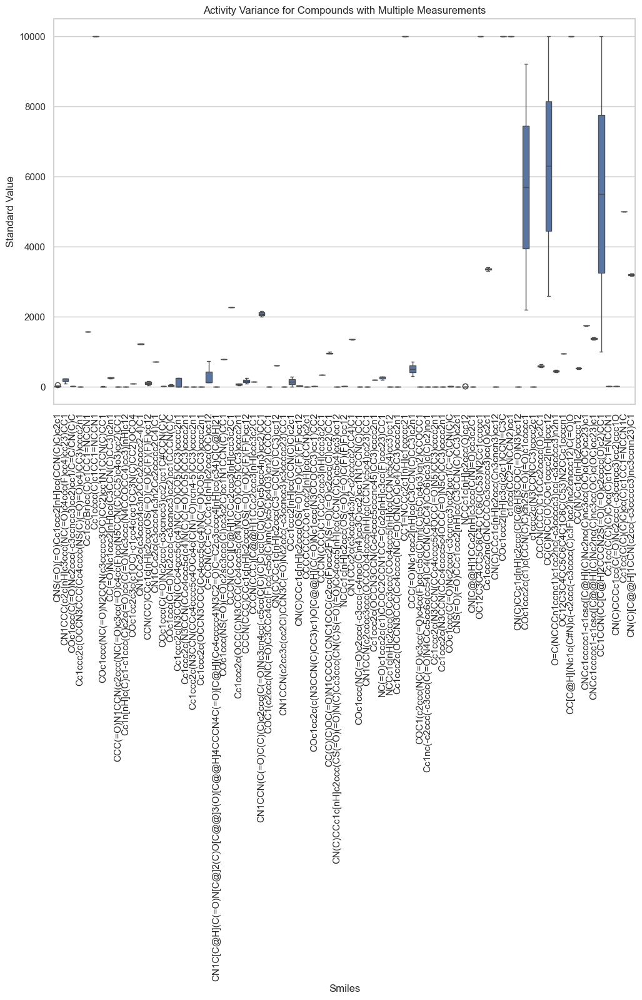


=== Processing dataset: data/cleaned_data/D1.csv ===
Running clustering: scaffold
Running clustering: jarvis-patrick
Running clustering: kmedoids
Running clustering: maxmin
Running clustering: butina
Running clustering: birch

Evaluating clustering with algorithm: scaffold
silhouette_score: 0.1644
adjusted_rand_score: 0.0121
mutual_info_score: 4.3865
normalized_mutual_info_score: 0.7540
homogeneity_score: 0.7150
completeness_score: 0.7974
v_measure_score: 0.7540
silhouette_score: 0.1644
t-SNE plot saved to TSNE_plots/tsne_D1_scaffold.png


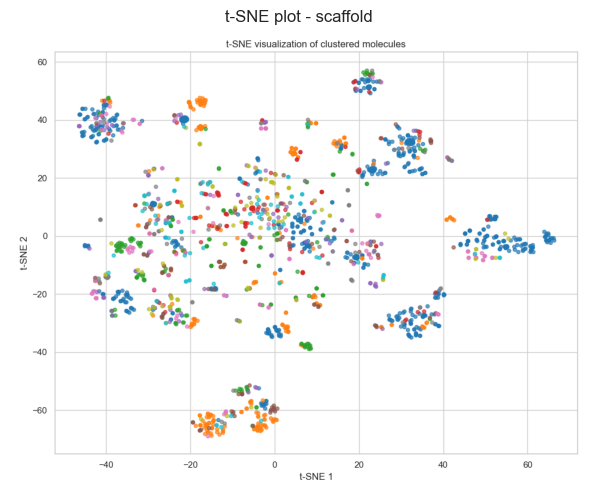

UMAP plot saved to UMAP_plots/umap_D1_scaffold.png


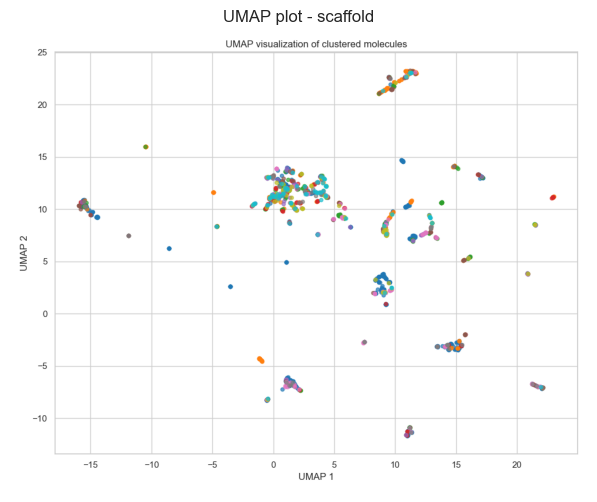


Evaluating clustering with algorithm: jarvis-patrick
silhouette_score: 0.2228
adjusted_rand_score: 0.0153
mutual_info_score: 5.5135
normalized_mutual_info_score: 0.8564
homogeneity_score: 0.8987
completeness_score: 0.8178
v_measure_score: 0.8564
silhouette_score: 0.2228
t-SNE plot saved to TSNE_plots/tsne_D1_jarvis-patrick.png


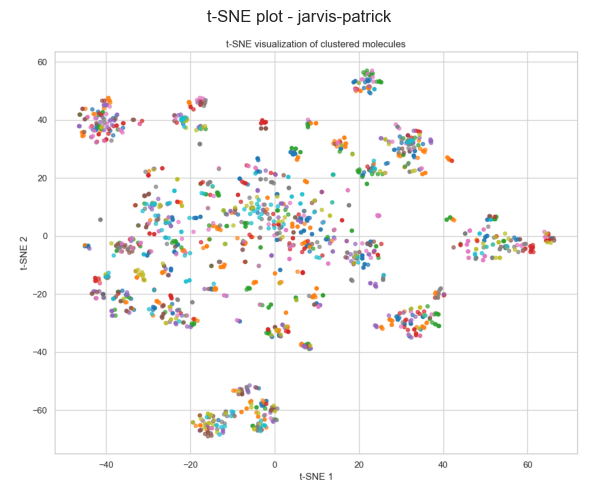

UMAP plot saved to UMAP_plots/umap_D1_jarvis-patrick.png


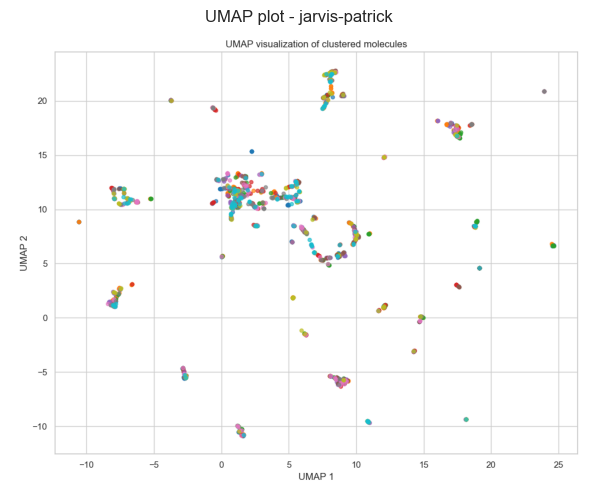


Evaluating clustering with algorithm: kmedoids
silhouette_score: -0.1064
adjusted_rand_score: 0.0000
mutual_info_score: 0.0047
normalized_mutual_info_score: 0.0015
homogeneity_score: 0.0008
completeness_score: 1.0000
v_measure_score: 0.0015
silhouette_score: -0.1064
t-SNE plot saved to TSNE_plots/tsne_D1_kmedoids.png


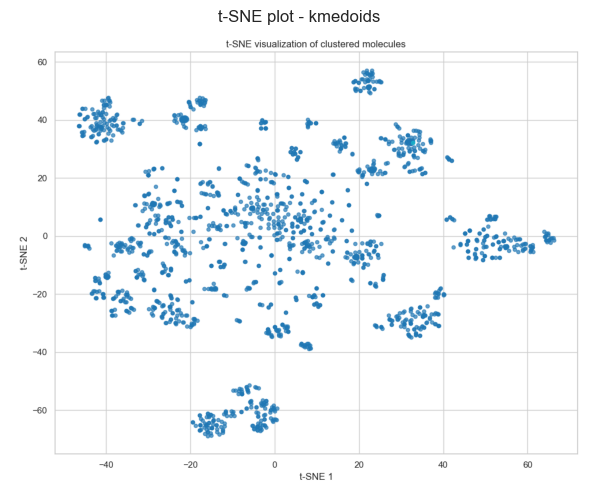

UMAP plot saved to UMAP_plots/umap_D1_kmedoids.png


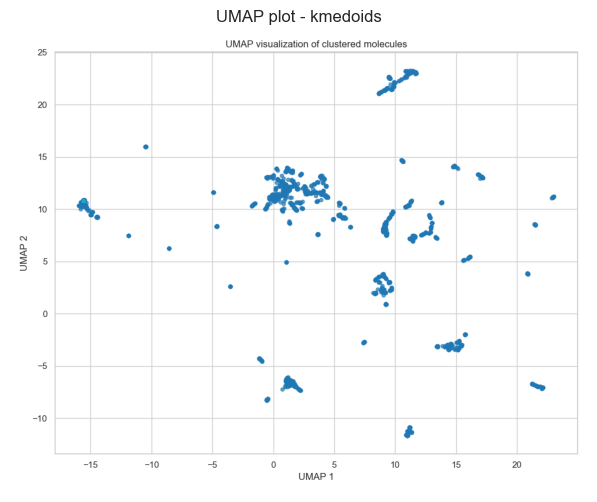


Evaluating clustering with algorithm: maxmin
silhouette_score: -0.0082
adjusted_rand_score: 0.0016
mutual_info_score: 0.4495
normalized_mutual_info_score: 0.1328
homogeneity_score: 0.0733
completeness_score: 0.7062
v_measure_score: 0.1328
silhouette_score: -0.0082
t-SNE plot saved to TSNE_plots/tsne_D1_maxmin.png


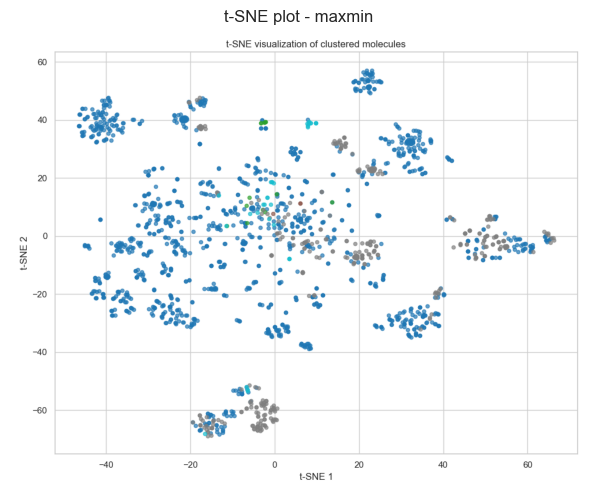

UMAP plot saved to UMAP_plots/umap_D1_maxmin.png


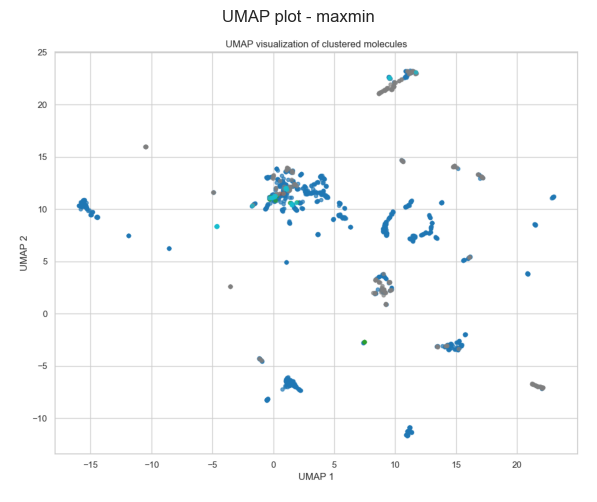


Evaluating clustering with algorithm: butina
silhouette_score: 0.2863
adjusted_rand_score: 0.0174
mutual_info_score: 4.5506
normalized_mutual_info_score: 0.7711
homogeneity_score: 0.7418
completeness_score: 0.8029
v_measure_score: 0.7711
silhouette_score: 0.2863
t-SNE plot saved to TSNE_plots/tsne_D1_butina.png


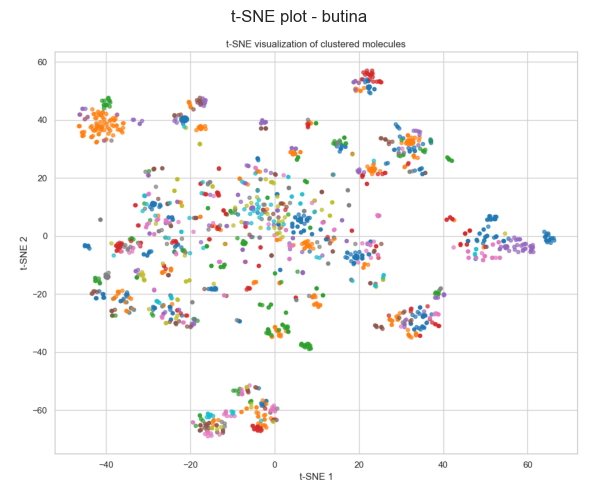

UMAP plot saved to UMAP_plots/umap_D1_butina.png


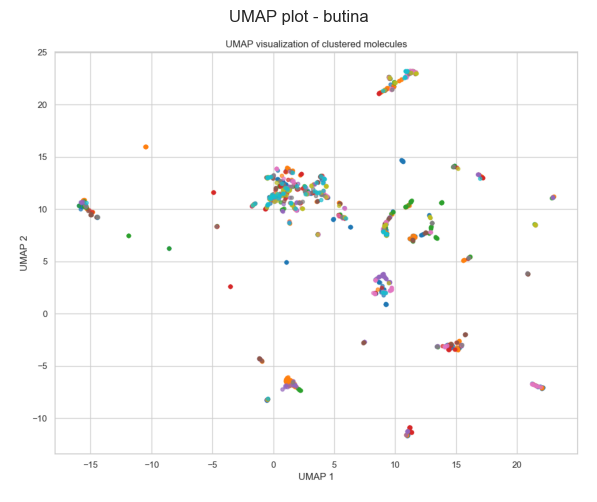


Evaluating clustering with algorithm: birch
silhouette_score: 0.0853
adjusted_rand_score: 0.0116
mutual_info_score: 0.9493
normalized_mutual_info_score: 0.2552
homogeneity_score: 0.1547
completeness_score: 0.7284
v_measure_score: 0.2552
silhouette_score: 0.0853
t-SNE plot saved to TSNE_plots/tsne_D1_birch.png


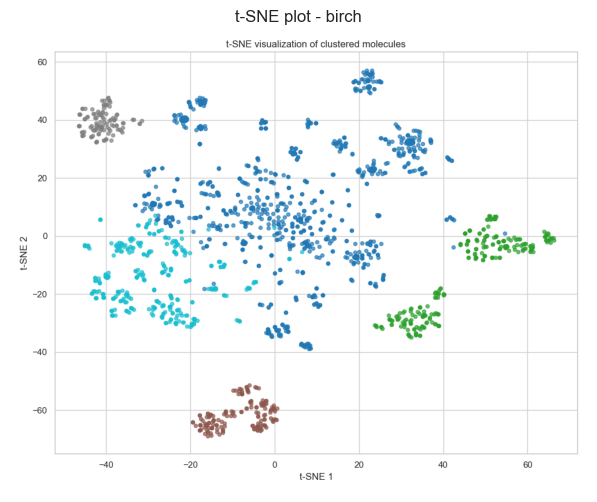

UMAP plot saved to UMAP_plots/umap_D1_birch.png


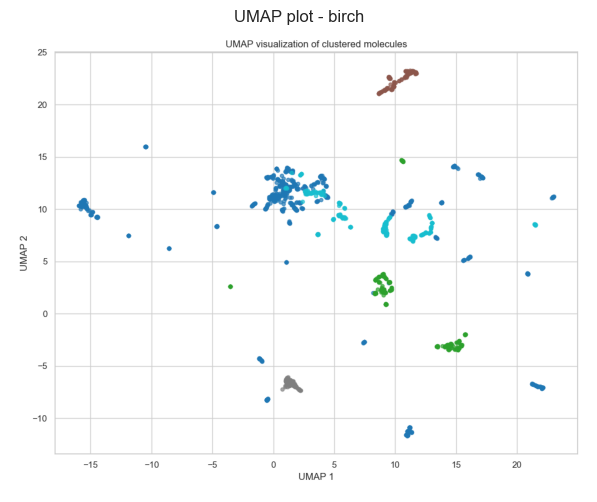


Cluster 0 dominant scaffolds:
  c1ccc(N2CCN(CCCCOc3ccn4nccc4c3)CC2)cc1: 1 compounds
  c1ccc(N2CCN(CCCCOc3ccn4nccc4c3)CC2)cc1: 1 compounds
  c1ccc(N2CCN(CCCCOc3ccn4nccc4c3)CC2)cc1: 1 compounds

Cluster 1 dominant scaffolds:
  O=C(CCCN1CCN(c2ccccc2)CC1)Nc1ccn2nccc2c1: 1 compounds
  O=C(CCCN1CCN(c2ccccc2)CC1)Nc1ccn2nccc2c1: 1 compounds
  O=C(CCCN1CCN(c2ccccc2)CC1)Nc1ccn2nccc2c1: 1 compounds

Cluster 2 dominant scaffolds:
  c1ccc(CCCCN2CCN(c3ccccn3)CC2)cc1: 1 compounds
  c1ccc(CCCCN2CCN(c3ccccn3)CC2)cc1: 1 compounds
  c1ccc(CCCCN2CCN(c3ccccn3)CC2)cc1: 1 compounds

Cluster 3 dominant scaffolds:
  O=C(CCCN1CCC(c2ccccc2)CC1)c1ccccc1: 1 compounds
  O=C(CCCN1CCC(c2ccccc2)CC1)c1ccccc1: 1 compounds
  O=C(CCCN1CCC(c2ccccc2)CC1)c1ccccc1: 1 compounds

Cluster 4 dominant scaffolds:
  O=C(Nc1cccc(N2CCNCC2)c1)N1CCN(c2ccccc2)CC1: 1 compounds
  O=C(Nc1cccc(N2CCNCC2)c1)N1CCN(c2ccccc2)CC1: 1 compounds
  O=C(Nc1cccc(N2CCNCC2)c1)N1CCN(c2ccccc2)CC1: 1 compounds

Cluster 5 dominant scaffolds:
  c1ccc2c(c1)C[C

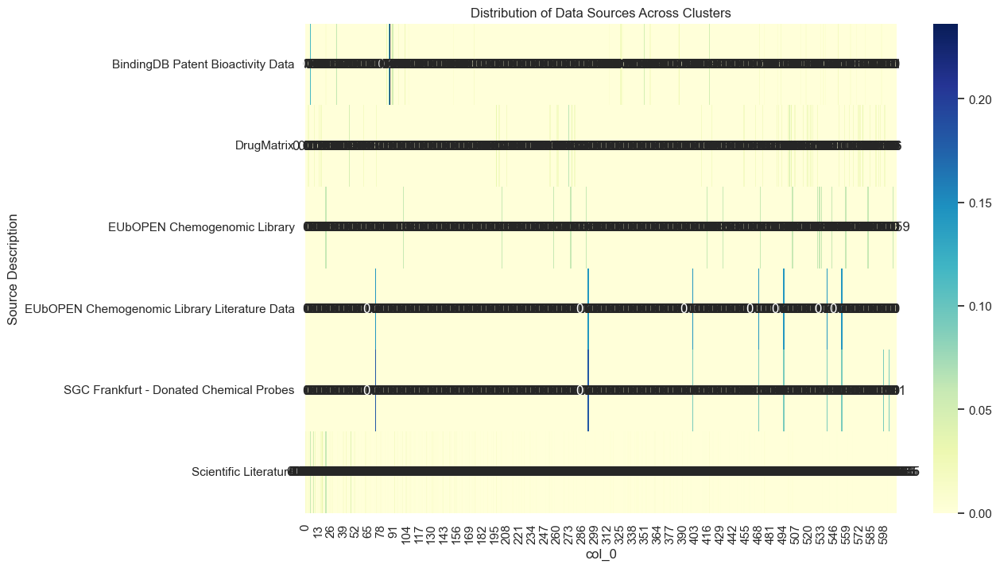

Chi-square test p-value: 0.0000
Significant correlation between clusters and data sources

Average standard deviation per cluster:
Cluster
0      1153.570338
1       920.042701
2       164.501009
3              NaN
4         0.000000
          ...     
606            NaN
607            NaN
608            NaN
609            NaN
610            NaN
Name: std, Length: 611, dtype: float64


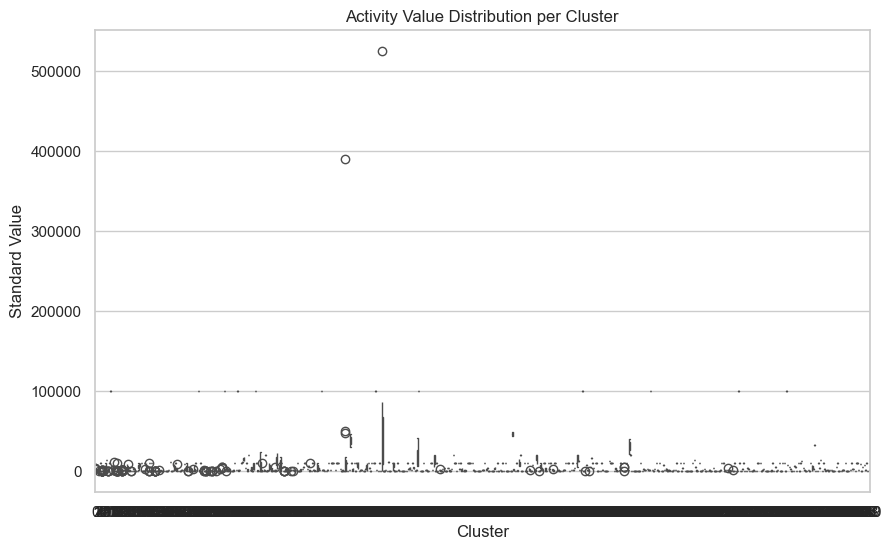


Compounds with high assay variance (>1.0):
                                                Smiles       std_dev
0                   Br.CN1CCc2ccccc2Cc2cc(O)c(O)cc2CC1    226.486302
1                      Br.CN1CCc2ccccc2Cc2ccc(O)cc2CC1      4.624478
2    CC(C)(C)[C@]1(O)CCN2C[C@H]3c4ccccc4CCc4cccc(c4...      1.089826
3                        CCCCCCCCCN1CCC(c2cccc(O)c2)C1   5671.024099
4           CCCCCCNC[C@H]1CCc2ccc(O)cc2O1.O=C(O)C(=O)O    303.143748
..                                                 ...           ...
154             OCCOCCN1CCN(C2=Nc3ccccc3Sc3ccccc32)CC1   1632.229405
155                      Oc1cc2c(cc1O)C(c1ccccc1)CNCC2    117.202105
156                 Oc1cc2c(cc1O)[C@@H](c1ccccc1)CNCC2    118.941169
157            Oc1cc2c(cc1O)[C@H]1c3ccccc3CN[C@@H]1CC2    524.730990
158  Oc1ccc2c(c1O)C[C@@H](c1ccccc1)[C@@H]1CCNC[C@@H]21  12694.688043

[114 rows x 2 columns]


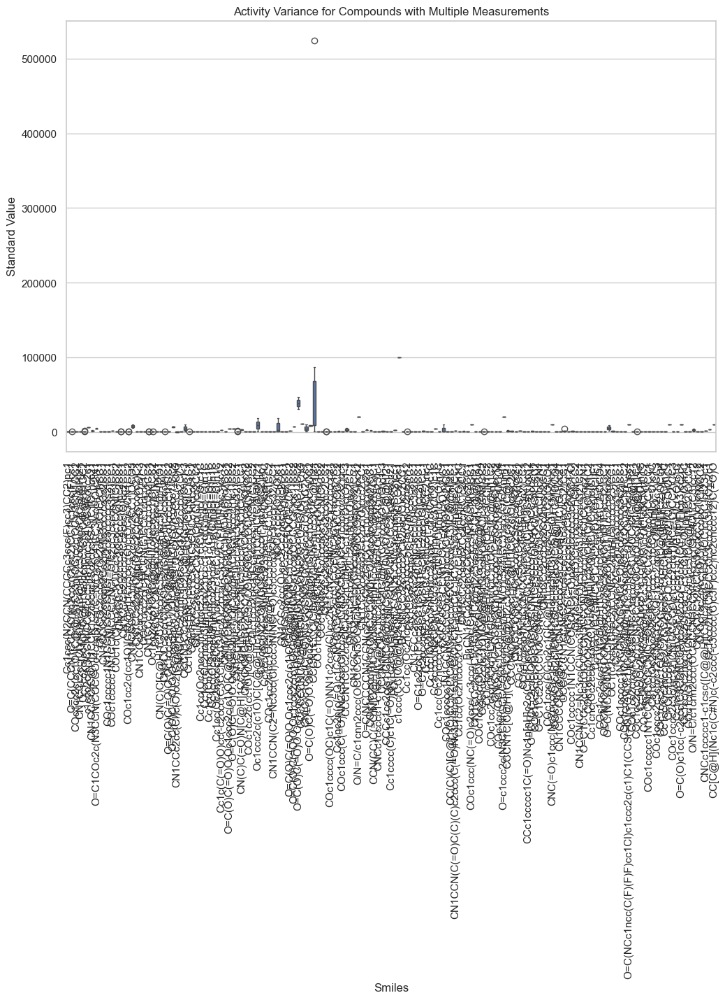


=== Processing dataset: data/cleaned_data/H1.csv ===
Running clustering: scaffold
Running clustering: jarvis-patrick
Running clustering: kmedoids
Running clustering: maxmin
Running clustering: butina
Running clustering: birch

Evaluating clustering with algorithm: scaffold
silhouette_score: 0.1794
adjusted_rand_score: 0.0357
mutual_info_score: 4.8027
normalized_mutual_info_score: 0.7918
homogeneity_score: 0.8058
completeness_score: 0.7783
v_measure_score: 0.7918
silhouette_score: 0.1794
t-SNE plot saved to TSNE_plots/tsne_H1_scaffold.png


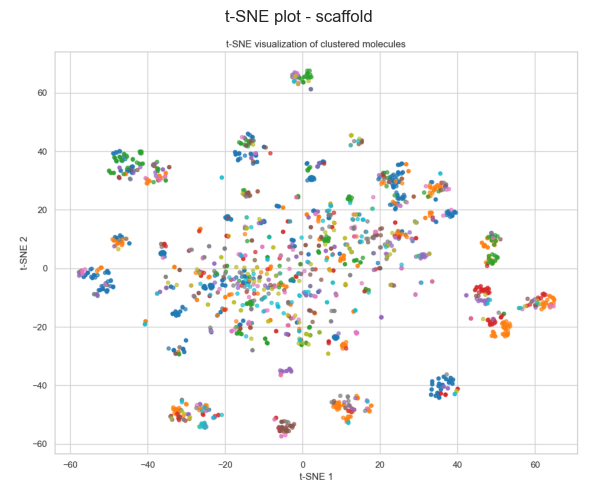

UMAP plot saved to UMAP_plots/umap_H1_scaffold.png


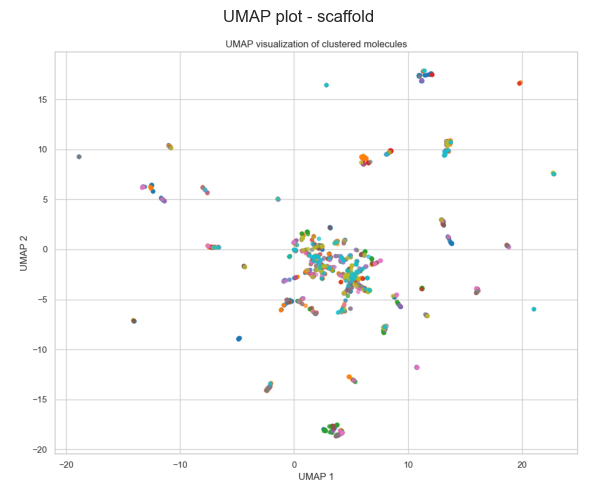


Evaluating clustering with algorithm: jarvis-patrick
silhouette_score: 0.2213
adjusted_rand_score: 0.0212
mutual_info_score: 5.2644
normalized_mutual_info_score: 0.8289
homogeneity_score: 0.8833
completeness_score: 0.7809
v_measure_score: 0.8289
silhouette_score: 0.2213
t-SNE plot saved to TSNE_plots/tsne_H1_jarvis-patrick.png


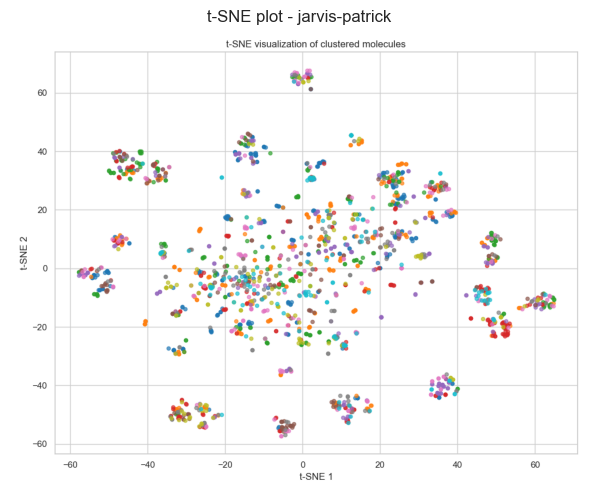

UMAP plot saved to UMAP_plots/umap_H1_jarvis-patrick.png


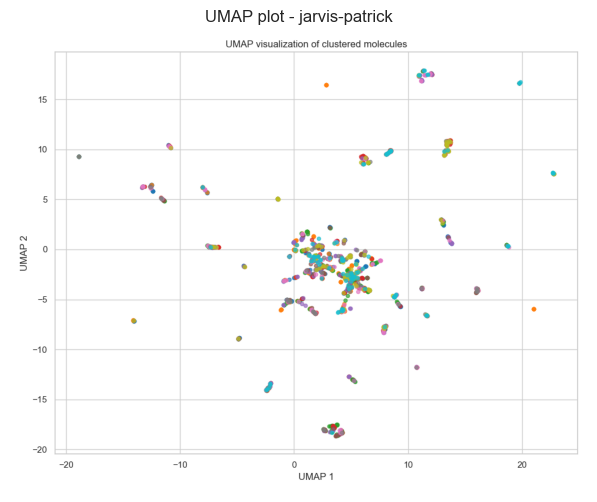


Evaluating clustering with algorithm: kmedoids
silhouette_score: 0.0149
adjusted_rand_score: 0.0081
mutual_info_score: 0.9426
normalized_mutual_info_score: 0.2493
homogeneity_score: 0.1582
completeness_score: 0.5888
v_measure_score: 0.2493
silhouette_score: 0.0149
t-SNE plot saved to TSNE_plots/tsne_H1_kmedoids.png


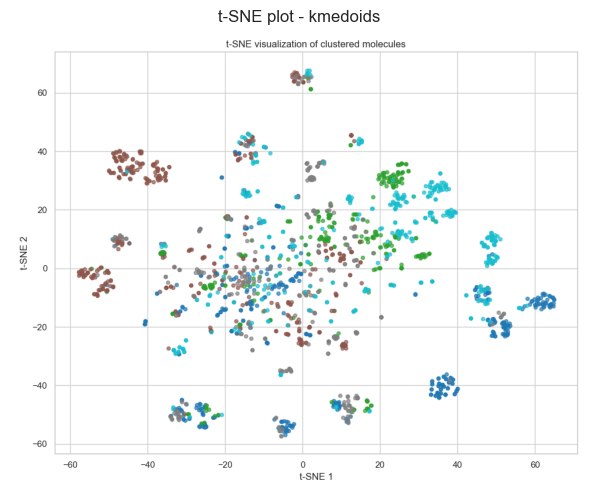

UMAP plot saved to UMAP_plots/umap_H1_kmedoids.png


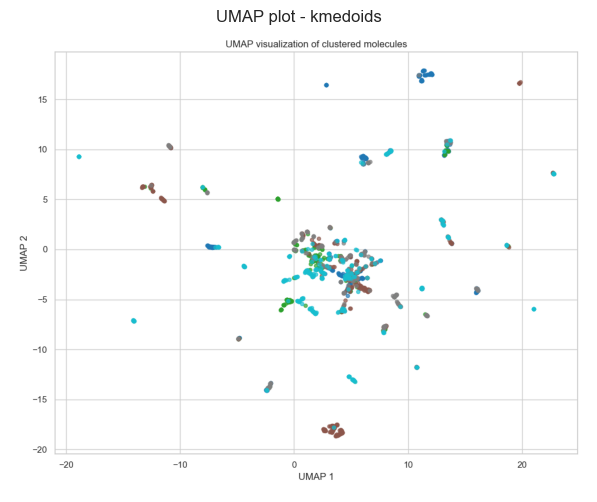


Evaluating clustering with algorithm: maxmin
silhouette_score: -0.0066
adjusted_rand_score: 0.0005
mutual_info_score: 0.4710
normalized_mutual_info_score: 0.1409
homogeneity_score: 0.0790
completeness_score: 0.6476
v_measure_score: 0.1409
silhouette_score: -0.0066
t-SNE plot saved to TSNE_plots/tsne_H1_maxmin.png


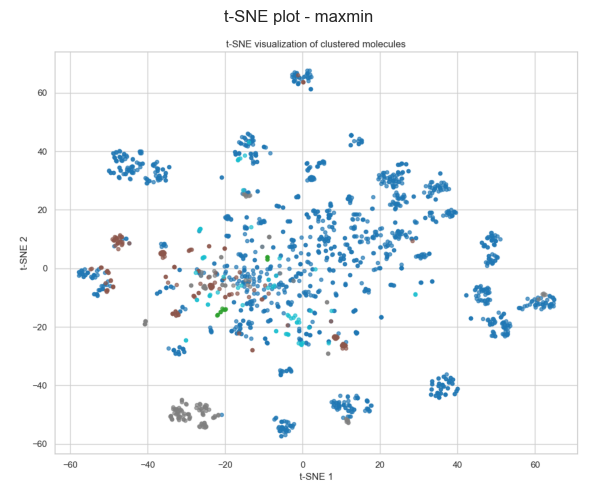

UMAP plot saved to UMAP_plots/umap_H1_maxmin.png


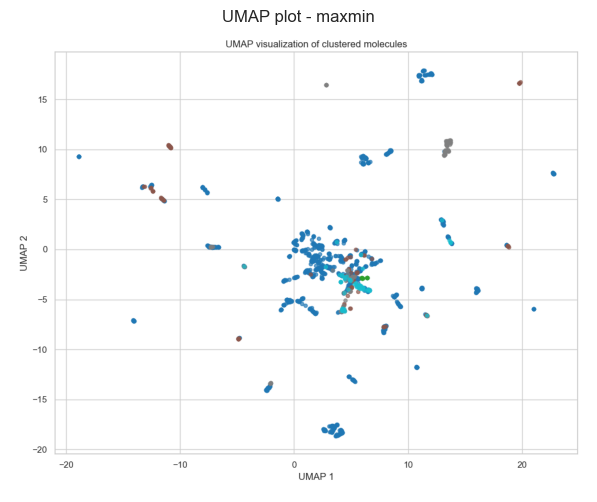


Evaluating clustering with algorithm: butina
silhouette_score: 0.2771
adjusted_rand_score: 0.0452
mutual_info_score: 4.4778
normalized_mutual_info_score: 0.7619
homogeneity_score: 0.7513
completeness_score: 0.7728
v_measure_score: 0.7619
silhouette_score: 0.2771
t-SNE plot saved to TSNE_plots/tsne_H1_butina.png


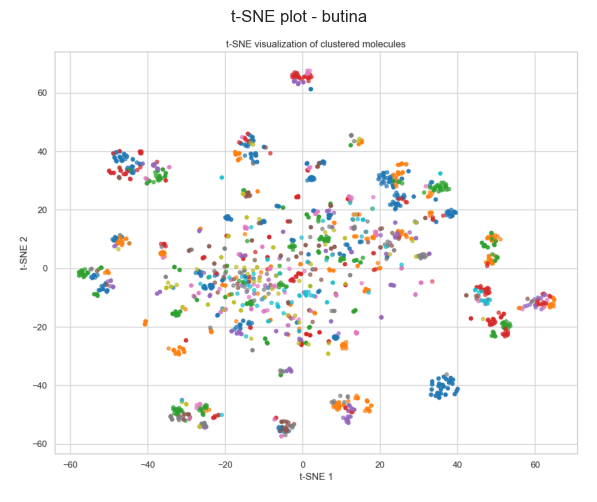

UMAP plot saved to UMAP_plots/umap_H1_butina.png


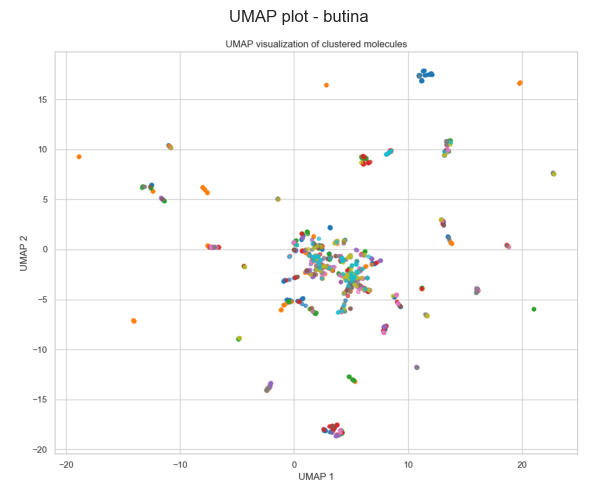


Evaluating clustering with algorithm: birch
silhouette_score: 0.0831
adjusted_rand_score: 0.0094
mutual_info_score: 0.7487
normalized_mutual_info_score: 0.2121
homogeneity_score: 0.1256
completeness_score: 0.6802
v_measure_score: 0.2121
silhouette_score: 0.0831
t-SNE plot saved to TSNE_plots/tsne_H1_birch.png


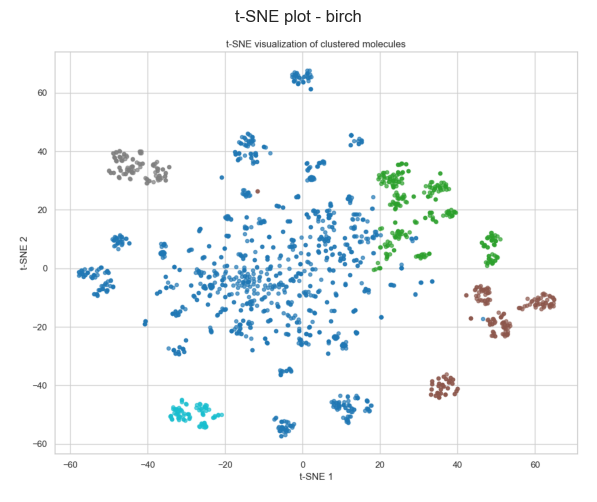

UMAP plot saved to UMAP_plots/umap_H1_birch.png


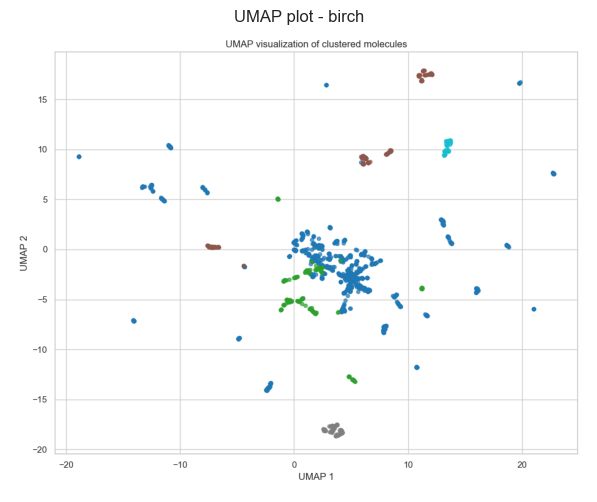


Cluster 0 dominant scaffolds:
  c1ccc2c(NCCC3CCCN3)c3c(nc2c1)CCCCC3: 1 compounds

Cluster 1 dominant scaffolds:
  c1c[nH]cn1: 1 compounds
  c1c[nH]cn1: 1 compounds
  c1c[nH]cn1: 1 compounds

Cluster 2 dominant scaffolds:
  c1ccc(-c2ccc(OCCCN3CCNCC3)cc2)cc1: 1 compounds
  c1ccc(-c2ccc(OCCCN3CCNCC3)cc2)cc1: 1 compounds
  c1ccc(-c2ccc(OCCCN3CCNCC3)cc2)cc1: 1 compounds

Cluster 3 dominant scaffolds:
  O=C(CCCN1CCC(c2ccccc2)C1)c1ccccc1: 1 compounds
  O=C(CCCN1CCC(c2ccccc2)C1)c1ccccc1: 1 compounds
  O=C(CCCN1CCC(c2ccccc2)C1)c1ccccc1: 1 compounds

Cluster 4 dominant scaffolds:
  c1ccc2c(c1)Cc1ccccc1[C@H]1OCC[C@H]21: 1 compounds
  c1ccc2c(c1)Cc1ccccc1[C@H]1OCC[C@H]21: 1 compounds
  c1ccc2c(c1)Cc1ccccc1[C@@H]1CCO[C@H]21: 1 compounds

Cluster 5 dominant scaffolds:
  O=C(CCCCN1CCC(c2ccccc2)CC1)c1nc2ccccc2s1: 1 compounds

Cluster 6 dominant scaffolds:
  c1ccc2c(c1)Sc1ccccc1N2CCCN1CCNCC1: 1 compounds
  c1ccc2c(c1)Sc1ccccc1N2CCCN1CCNCC1: 1 compounds
  c1ccc2c(c1)Sc1ccccc1N2CCCN1CCNCC1: 1 compounds


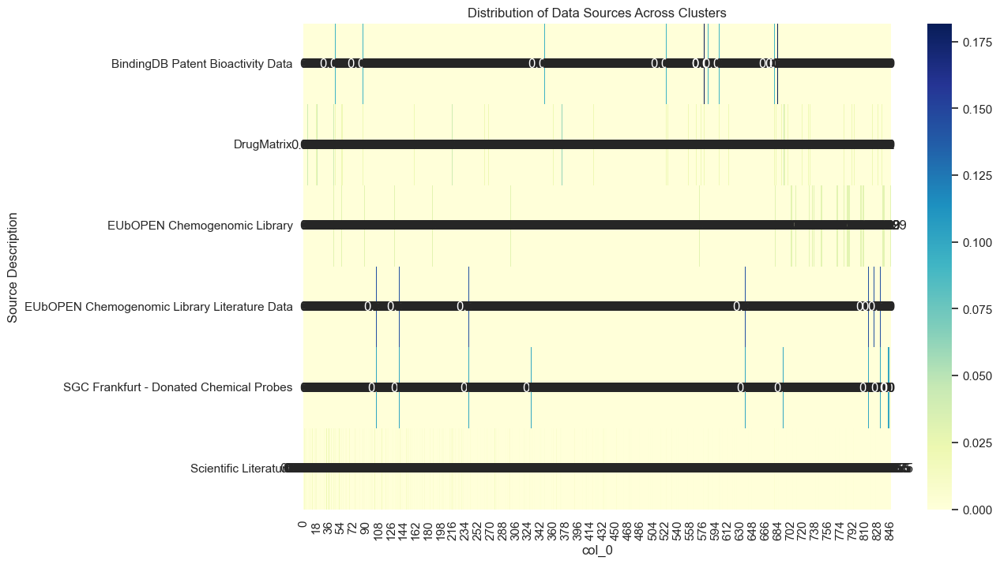

Chi-square test p-value: 0.0000
Significant correlation between clusters and data sources

Average standard deviation per cluster:
Cluster
0               NaN
1      1.410621e+15
2      1.846461e+03
3      8.537607e+02
4      9.559680e+00
           ...     
842             NaN
843    0.000000e+00
844    0.000000e+00
845             NaN
846             NaN
Name: std, Length: 847, dtype: float64


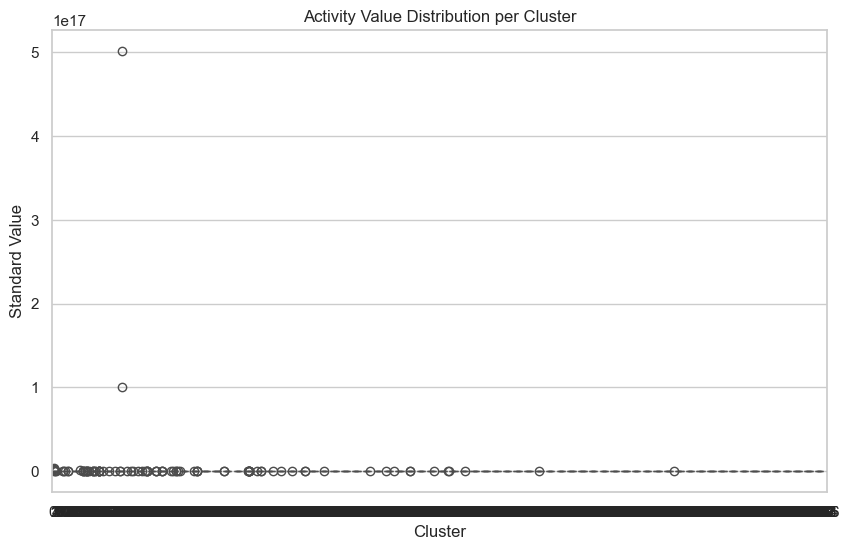


Compounds with high assay variance (>1.0):
                                                Smiles      std_dev
0                Br.c1ccc2c(c1)CCN(CCCc1nc3ccccc3s1)C2     6.484169
1                    C1=C(CCN2CCc3ccccc3C2)CCc2ccccc21     5.967981
2                    C=CCN(CC=C)CCc1c[nH]c2ccc(Br)cc12  7000.357134
3                     C=CCN(CC=C)CCc1c[nH]c2ccc(C)cc12  6593.007059
4                    C=CCN(CC=C)CCc1c[nH]c2ccc(Cl)cc12  7000.357134
..                                                 ...          ...
151  O=c1c2ccccc2c(Cc2ccc(Cl)cc2)nn1C[C@H]1CCCN1CCC...     2.925000
153     OCCN1CCN(CCCN2c3ccccc3Sc3ccc(C(F)(F)F)cc32)CC1    24.987739
154             OCCOCCN1CCN(C2=Nc3ccccc3Sc3ccccc32)CC1     5.840263
157             c1ccc2c(c1)CCN(CCCCc1c[nH]c3ccccc13)C2     2.998133
158               c1cnc(N2CCN(CCCc3nc4ccccc4s3)CC2)nc1     3.931514

[81 rows x 2 columns]


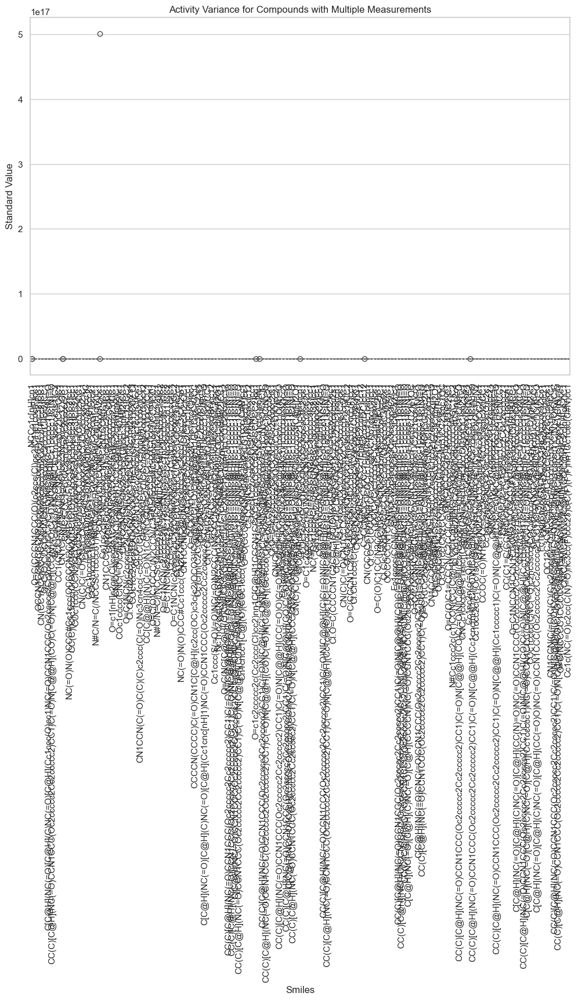


=== Processing dataset: data/cleaned_data/H2.csv ===
Running clustering: scaffold
Running clustering: jarvis-patrick
Running clustering: kmedoids
Running clustering: maxmin
Running clustering: butina
Running clustering: birch

Evaluating clustering with algorithm: scaffold
silhouette_score: 0.1387
adjusted_rand_score: 0.0387
mutual_info_score: 4.3171
normalized_mutual_info_score: 0.8147
homogeneity_score: 0.8190
completeness_score: 0.8104
v_measure_score: 0.8147
silhouette_score: 0.1387
t-SNE plot saved to TSNE_plots/tsne_H2_scaffold.png


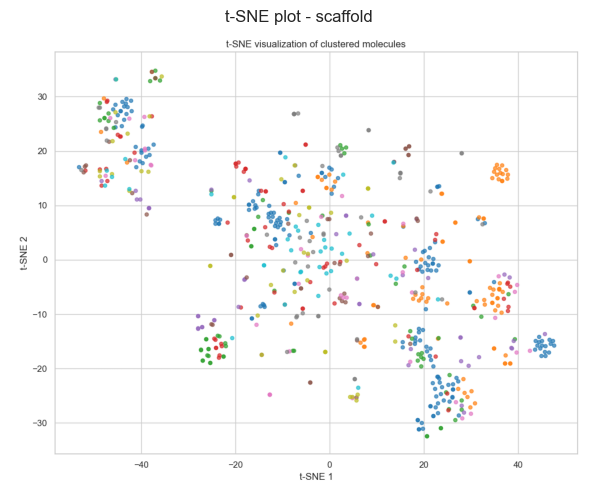

UMAP plot saved to UMAP_plots/umap_H2_scaffold.png


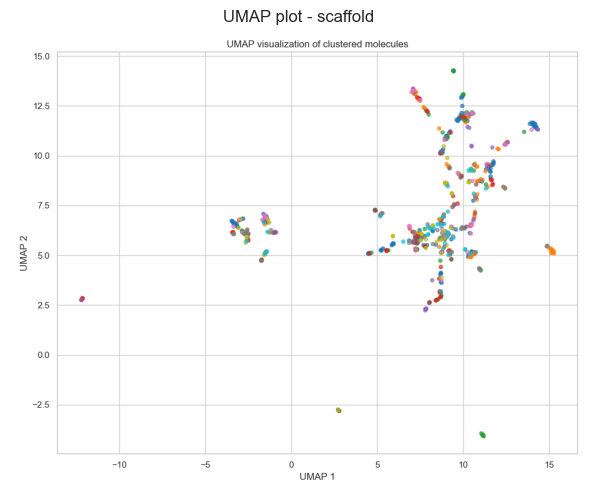


Evaluating clustering with algorithm: jarvis-patrick
silhouette_score: 0.2414
adjusted_rand_score: 0.0246
mutual_info_score: 4.6138
normalized_mutual_info_score: 0.8414
homogeneity_score: 0.8753
completeness_score: 0.8100
v_measure_score: 0.8414
silhouette_score: 0.2414
t-SNE plot saved to TSNE_plots/tsne_H2_jarvis-patrick.png


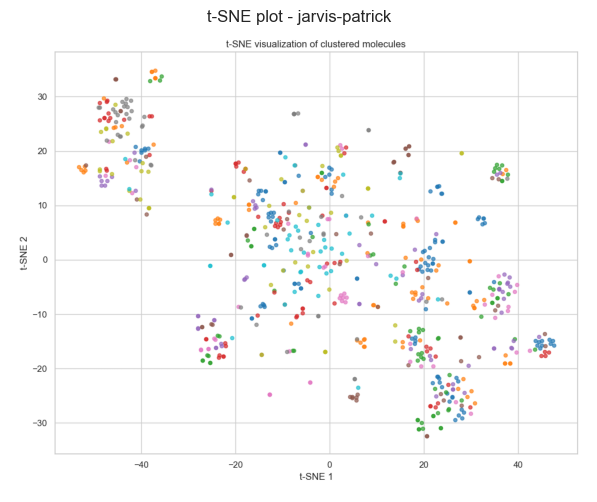

UMAP plot saved to UMAP_plots/umap_H2_jarvis-patrick.png


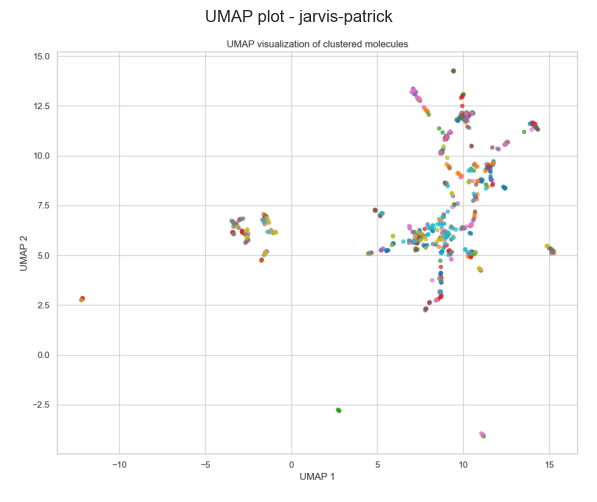


Evaluating clustering with algorithm: kmedoids
silhouette_score: 0.0460
adjusted_rand_score: 0.0160
mutual_info_score: 1.1308
normalized_mutual_info_score: 0.3306
homogeneity_score: 0.2145
completeness_score: 0.7199
v_measure_score: 0.3306
silhouette_score: 0.0460
t-SNE plot saved to TSNE_plots/tsne_H2_kmedoids.png


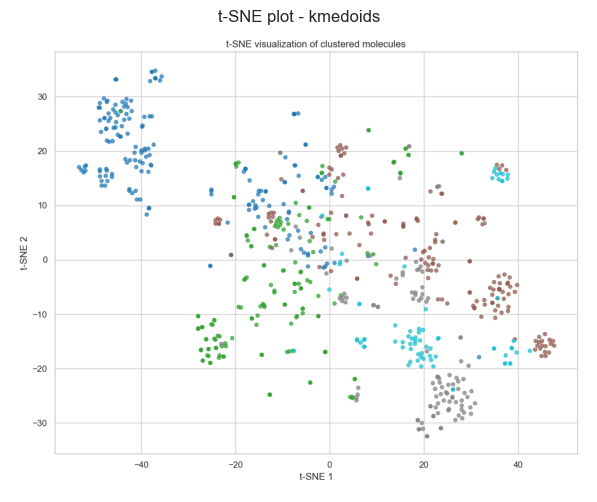

UMAP plot saved to UMAP_plots/umap_H2_kmedoids.png


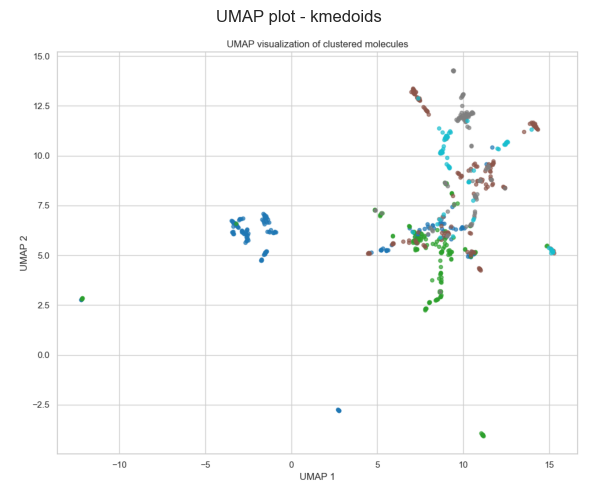


Evaluating clustering with algorithm: maxmin
silhouette_score: 0.0144
adjusted_rand_score: 0.0245
mutual_info_score: 0.7094
normalized_mutual_info_score: 0.2310
homogeneity_score: 0.1346
completeness_score: 0.8143
v_measure_score: 0.2310
silhouette_score: 0.0144
t-SNE plot saved to TSNE_plots/tsne_H2_maxmin.png


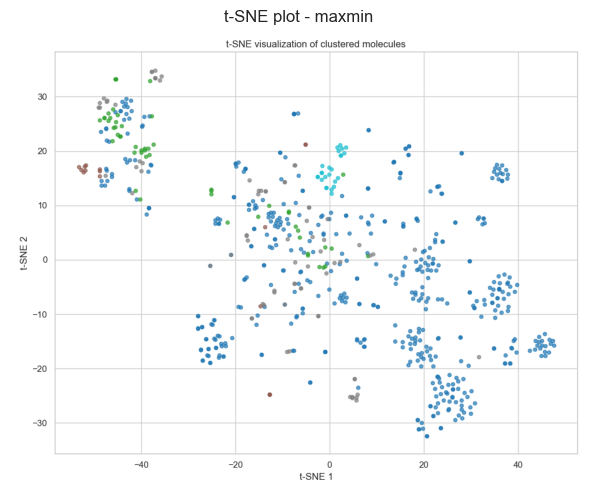

UMAP plot saved to UMAP_plots/umap_H2_maxmin.png


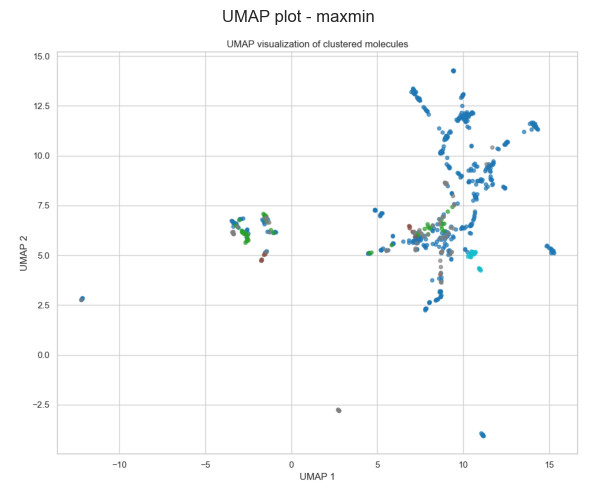


Evaluating clustering with algorithm: butina
silhouette_score: 0.2664
adjusted_rand_score: 0.0477
mutual_info_score: 3.9574
normalized_mutual_info_score: 0.7768
homogeneity_score: 0.7508
completeness_score: 0.8047
v_measure_score: 0.7768
silhouette_score: 0.2664
t-SNE plot saved to TSNE_plots/tsne_H2_butina.png


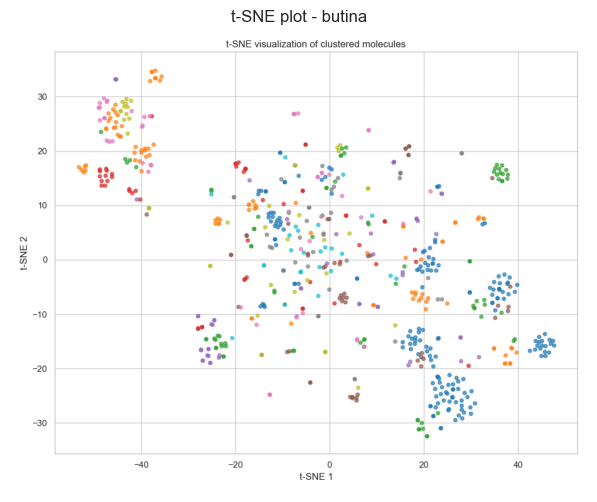

UMAP plot saved to UMAP_plots/umap_H2_butina.png


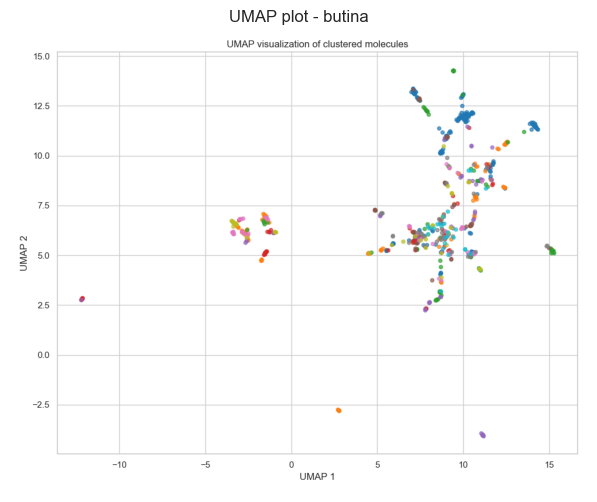


Evaluating clustering with algorithm: birch
silhouette_score: 0.0753
adjusted_rand_score: 0.0621
mutual_info_score: 0.9954
normalized_mutual_info_score: 0.3069
homogeneity_score: 0.1888
completeness_score: 0.8181
v_measure_score: 0.3069
silhouette_score: 0.0753
t-SNE plot saved to TSNE_plots/tsne_H2_birch.png


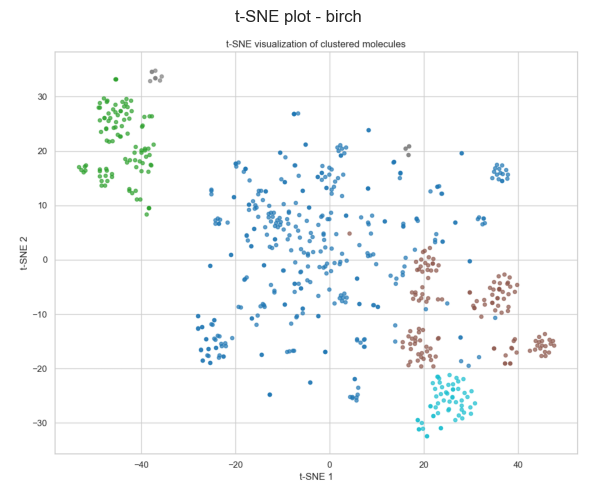

UMAP plot saved to UMAP_plots/umap_H2_birch.png


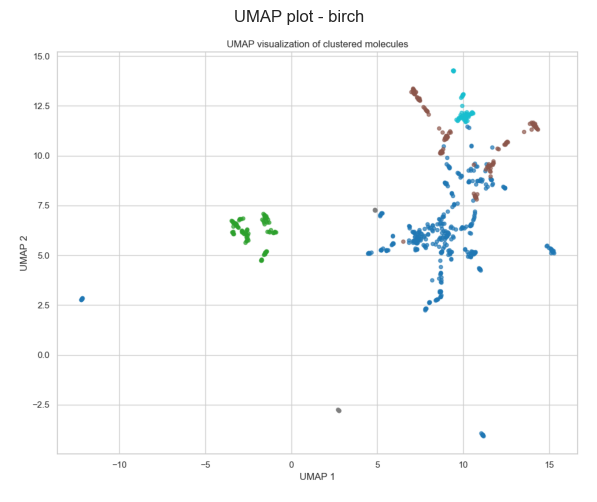


Cluster 0 dominant scaffolds:
  c1ccc(-c2ccc(OCCCN3CCCCC3)cc2)cc1: 1 compounds
  c1ccc(-c2ccc(OCCCN3CCCCC3)cc2)cc1: 1 compounds
  c1ccc(-c2ccc(OCCCN3CCCCC3)cc2)cc1: 1 compounds

Cluster 1 dominant scaffolds:
  c1ccc(-c2ccc(OCCCN3CCOCC3)cc2)cc1: 1 compounds

Cluster 2 dominant scaffolds:
  O=C1c2ccc(-c3ccccc3)cc2CCN1CCN1CCCC1: 1 compounds
  O=C1c2ccc(-c3ccccc3)cc2CCN1CCN1CCCC1: 1 compounds

Cluster 3 dominant scaffolds:
  c1ccc(CCNCCc2ccc3cccnc3c2)cc1: 1 compounds
  c1ccc(CCNCCc2ccc3cccnc3c2)cc1: 1 compounds

Cluster 4 dominant scaffolds:
  S=C(NCCCCCc1c[nH]cn1)NCCc1ccccc1: 1 compounds

Cluster 5 dominant scaffolds:
  O=C(c1ccc(OCCCN2CC[C@H](NS(=O)(=O)c3ccccc3)C2)cc1)C1CC1: 1 compounds
  O=C(c1ccc(OCCCN2CC[C@H](NS(=O)(=O)c3ccccc3)C2)cc1)C1CC1: 1 compounds
  O=C(c1ccc(OCCCN2CC[C@H](NS(=O)(=O)c3ccccc3)C2)cc1)C1CC1: 1 compounds

Cluster 6 dominant scaffolds:
  c1ccc(-c2ccc(OCCCN3CCNCC3)cc2)cc1: 1 compounds
  c1ccc(-c2ccc(OCCCN3CCNCC3)cc2)cc1: 1 compounds
  c1ccc(-c2ccc(OCCCN3CCNCC3)cc2)cc

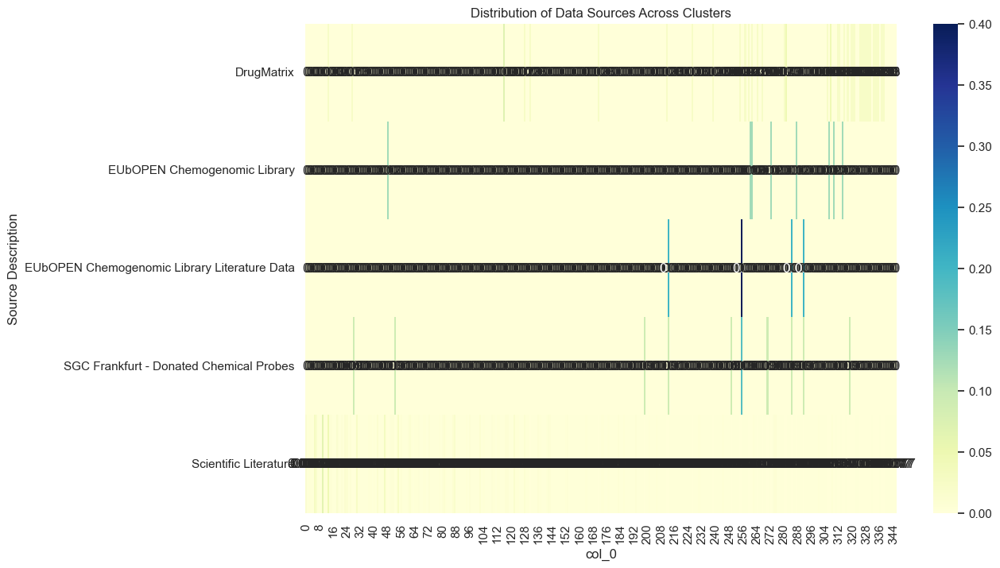

Chi-square test p-value: 0.0000
Significant correlation between clusters and data sources

Average standard deviation per cluster:
Cluster
0       5767.486649
1               NaN
2      31819.805153
3               NaN
4               NaN
           ...     
341             NaN
342             NaN
343             NaN
344             NaN
345             NaN
Name: std, Length: 346, dtype: float64


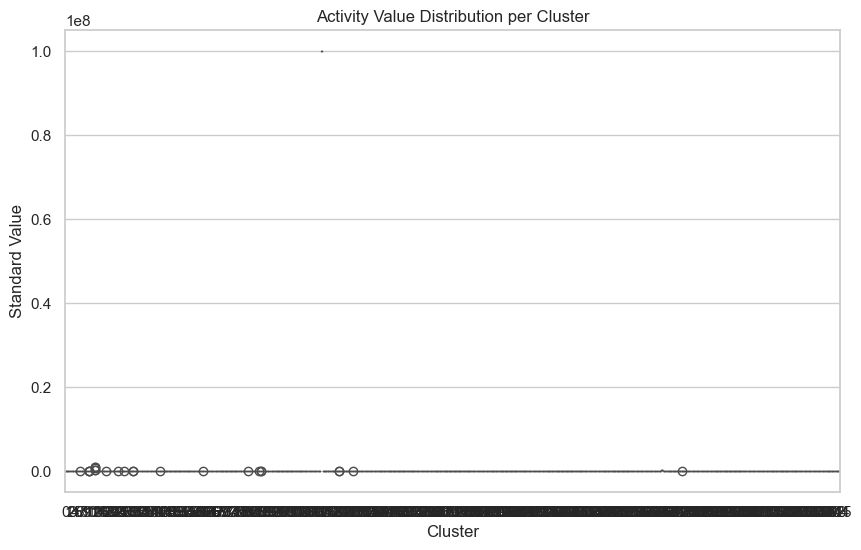


Compounds with high assay variance (>1.0):
                                               Smiles       std_dev
1   C=CC(=O)Nc1ccc2[nH]c(=O)n(C3CCN(Cc4ccc(-c5nc6c...     96.718066
2                   C=CCN(CC=C)CCc1c[nH]c2ccc(OC)cc12     13.293607
4                  CC(=O)c1ccc(OCCCN2CC[C@H](N)C2)cc1  13435.028843
7   CC(C)(C)CNc1nccc(N2CCN(C(=N)N)CC2)n1.O=C(O)C(F...   6363.961031
11  CC(C)(C)CNc1nccc(N2CC[C@@H](NC(=N)N)C2)n1.O=C(...   6363.961031
13  CC(C)(C)CNc1nccc(NC2CCNC2)n1.O=C(O)C(F)(F)F.O=...   6363.961031
15  CC(C)(C)CNc1nccc(NCCCN)n1.O=C(O)C(F)(F)F.O=C(O...   6363.961031
16  CC(C)(C)CNc1nccc(NCCN)n1.O=C(O)C(F)(F)F.O=C(O)...   6363.961031
17  CC(C)(C)OC(=O)N1CCCC1CNC1CCC(c2cc(F)ccc2F)(S(=...      4.555294
21                           CCCN[C@H]1CCc2nc(N)sc2C1   7863.621376
22  CC[C@@H](N)C(=O)N1CCN(CCCOc2ccc(C(=O)C3CC3)cc2...  62957.407826
23  CN(C)[C@@H]1CCN(c2ccnc(NCC(C)(C)C)n2)C1.O=C(O)...   6363.961031
25                       CN/C(=N\CCSCc1nc[nH]c1C)NC#N   2146.050058
27  

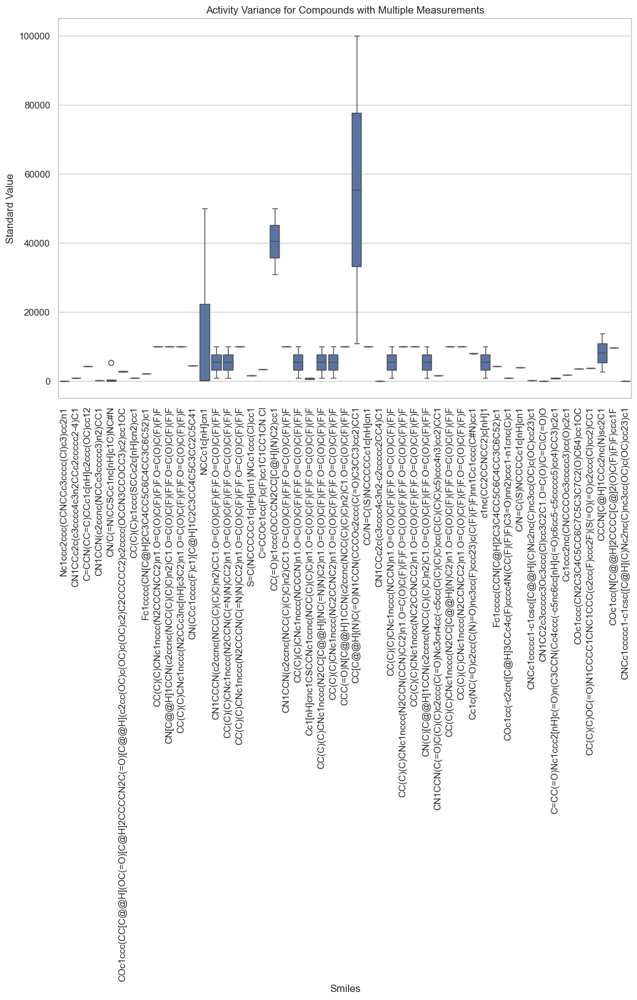


=== Processing dataset: data/cleaned_data/M1.csv ===
Running clustering: scaffold
Running clustering: jarvis-patrick
Running clustering: kmedoids
Running clustering: maxmin
Running clustering: butina
Running clustering: birch

Evaluating clustering with algorithm: scaffold
silhouette_score: 0.1994
adjusted_rand_score: 0.0530
mutual_info_score: 5.0377
normalized_mutual_info_score: 0.8212
homogeneity_score: 0.8022
completeness_score: 0.8412
v_measure_score: 0.8212
silhouette_score: 0.1994
t-SNE plot saved to TSNE_plots/tsne_M1_scaffold.png


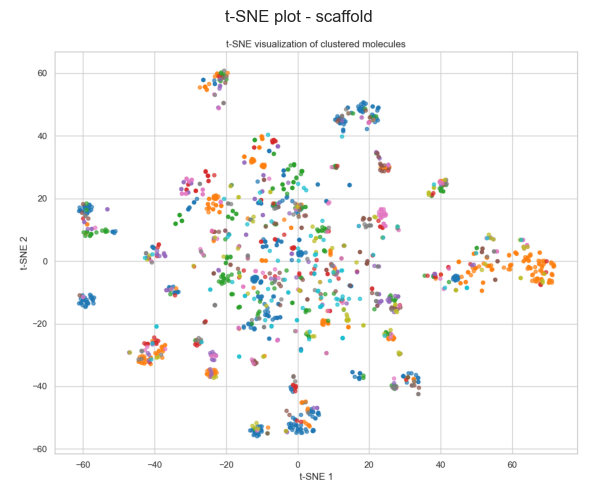

UMAP plot saved to UMAP_plots/umap_M1_scaffold.png


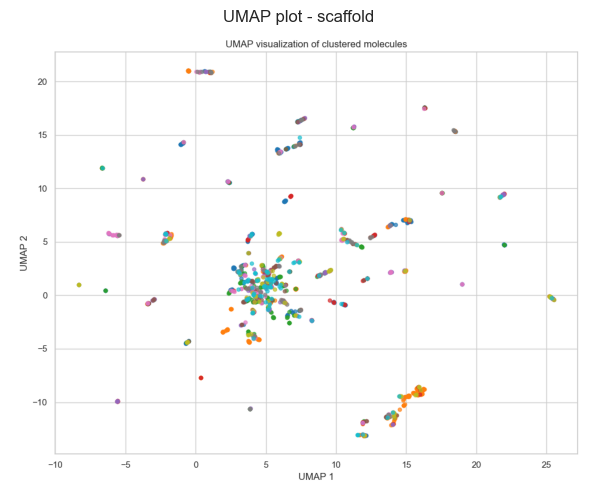


Evaluating clustering with algorithm: jarvis-patrick
silhouette_score: 0.2418
adjusted_rand_score: 0.0197
mutual_info_score: 5.5408
normalized_mutual_info_score: 0.8607
homogeneity_score: 0.8823
completeness_score: 0.8400
v_measure_score: 0.8607
silhouette_score: 0.2418
t-SNE plot saved to TSNE_plots/tsne_M1_jarvis-patrick.png


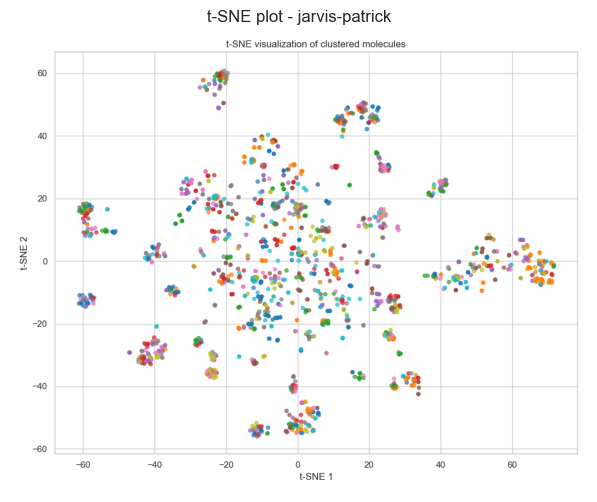

UMAP plot saved to UMAP_plots/umap_M1_jarvis-patrick.png


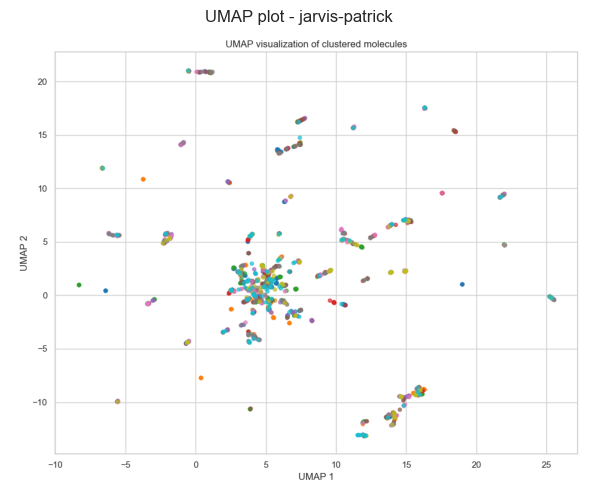


Evaluating clustering with algorithm: kmedoids
silhouette_score: 0.0014
adjusted_rand_score: 0.0058
mutual_info_score: 0.8358
normalized_mutual_info_score: 0.2221
homogeneity_score: 0.1331
completeness_score: 0.6705
v_measure_score: 0.2221
silhouette_score: 0.0014
t-SNE plot saved to TSNE_plots/tsne_M1_kmedoids.png


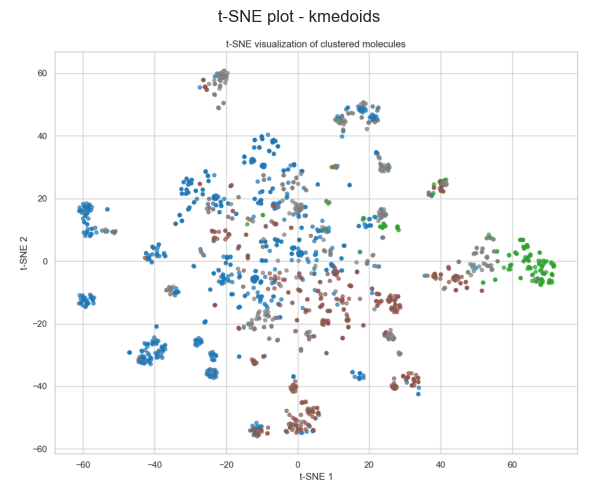

UMAP plot saved to UMAP_plots/umap_M1_kmedoids.png


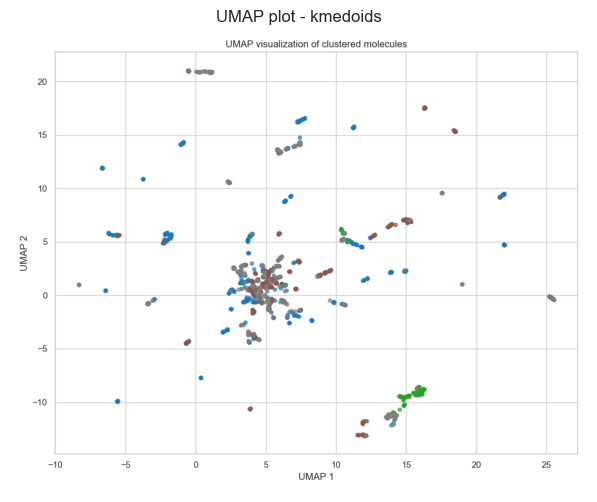


Evaluating clustering with algorithm: maxmin
silhouette_score: -0.0202
adjusted_rand_score: -0.0018
mutual_info_score: 0.6128
normalized_mutual_info_score: 0.1705
homogeneity_score: 0.0976
completeness_score: 0.6740
v_measure_score: 0.1705
silhouette_score: -0.0202
t-SNE plot saved to TSNE_plots/tsne_M1_maxmin.png


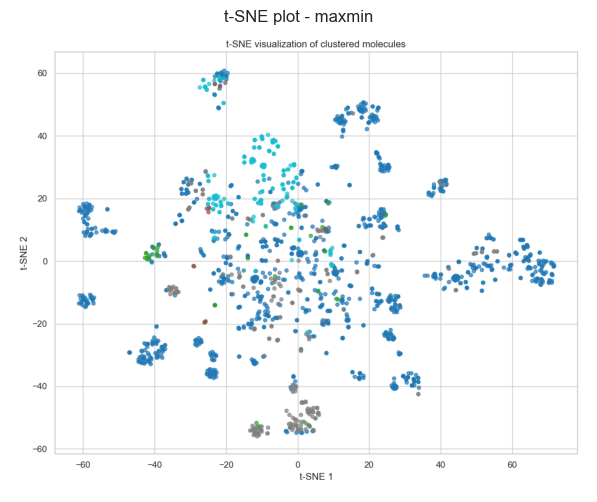

UMAP plot saved to UMAP_plots/umap_M1_maxmin.png


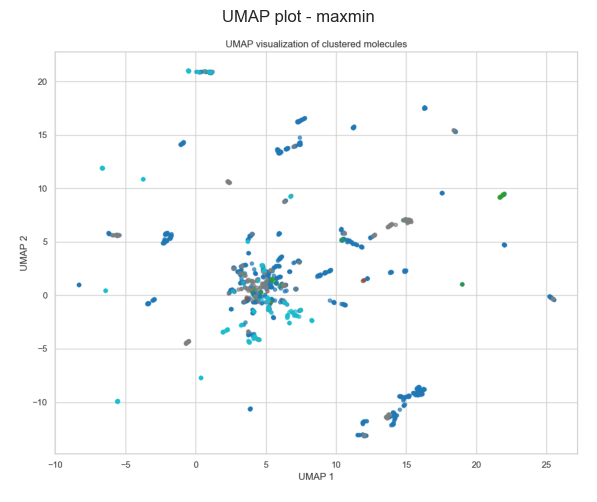


Evaluating clustering with algorithm: butina
silhouette_score: 0.3382
adjusted_rand_score: 0.0258
mutual_info_score: 4.7409
normalized_mutual_info_score: 0.7907
homogeneity_score: 0.7550
completeness_score: 0.8299
v_measure_score: 0.7907
silhouette_score: 0.3382
t-SNE plot saved to TSNE_plots/tsne_M1_butina.png


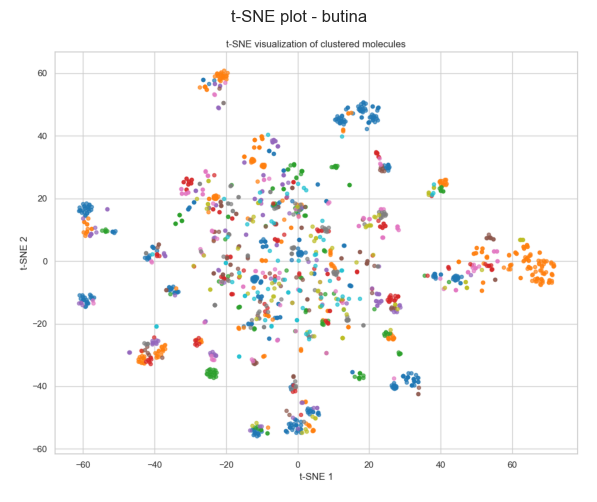

UMAP plot saved to UMAP_plots/umap_M1_butina.png


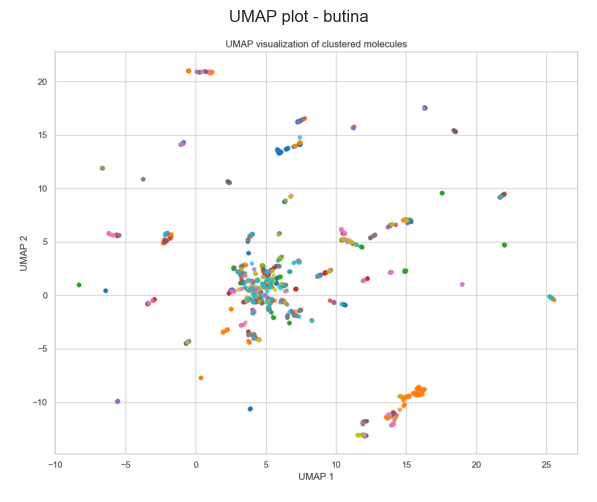


Evaluating clustering with algorithm: birch
silhouette_score: 0.0593
adjusted_rand_score: -0.0008
mutual_info_score: 0.5692
normalized_mutual_info_score: 0.1608
homogeneity_score: 0.0906
completeness_score: 0.7122
v_measure_score: 0.1608
silhouette_score: 0.0593
t-SNE plot saved to TSNE_plots/tsne_M1_birch.png


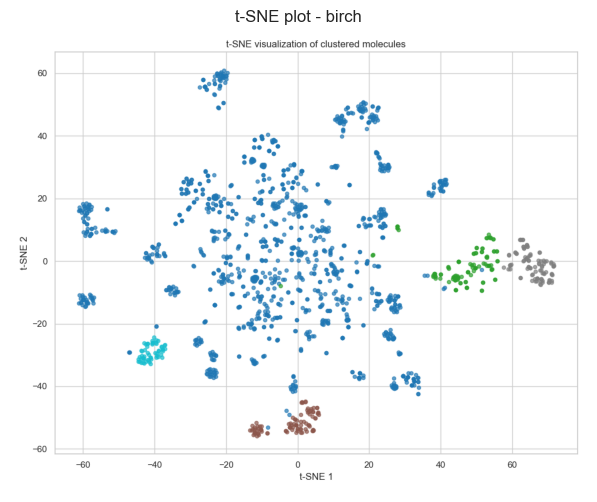

UMAP plot saved to UMAP_plots/umap_M1_birch.png


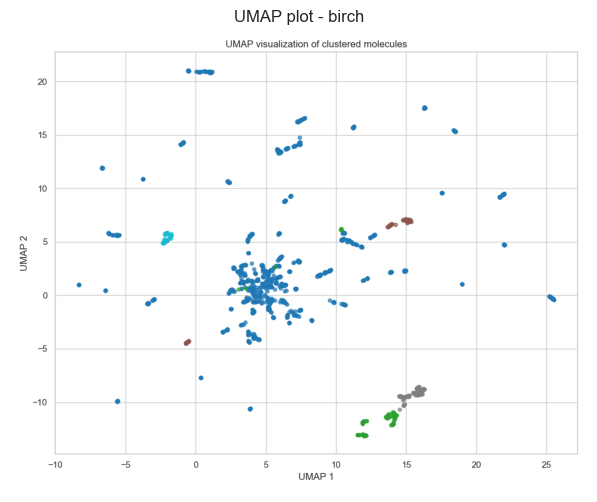


Cluster 0 dominant scaffolds:
  O=C(C(c1ccccc1)C1CCCC1)N1CCCCC1: 1 compounds
  O=C(C(c1ccccc1)C1CCCC1)N1CCCCC1: 1 compounds
  O=C(C(c1ccccc1)C1CCCC1)N1CCCCC1: 1 compounds

Cluster 1 dominant scaffolds:
  C1=C(c2nsnc2OCCCCCCCCCCCCOc2cnsn2)CNCC1: 1 compounds

Cluster 2 dominant scaffolds:
  C1=C(Cc2ccccn2)c2ccccc2C1: 1 compounds
  C1=C(Cc2ccccn2)c2ccccc2C1: 1 compounds
  C1=C(Cc2ccccn2)c2ccccc2C1: 1 compounds

Cluster 3 dominant scaffolds:
  c1ccc2c(c1)CCN1Cc3c(ccc4[nH]ccc34)OC21: 1 compounds
  c1ccc2c(c1)CCN1Cc3c(ccc4[nH]ccc34)OC21: 1 compounds
  c1ccc2c(c1)CCN1Cc3c(ccc4[nH]ccc34)OC21: 1 compounds

Cluster 4 dominant scaffolds:
  C1=C(c2ccccc2)C2CCN1CC2: 1 compounds
  C1=C(c2ccccc2)C2CCN1CC2: 1 compounds

Cluster 5 dominant scaffolds:
  c1cncc(Cc2csc3ccccc23)c1: 1 compounds
  c1cncc(Cc2csc3ccccc23)c1: 1 compounds
  c1cncc(Cc2csc3ccccc23)c1: 1 compounds

Cluster 6 dominant scaffolds:
  c1ccc(N2CCN(Cc3c[nH]c4ncccc34)CC2)cc1: 1 compounds
  c1ccc(N2CCN(Cc3c[nH]c4ncccc34)CC2)cc1: 1 compound

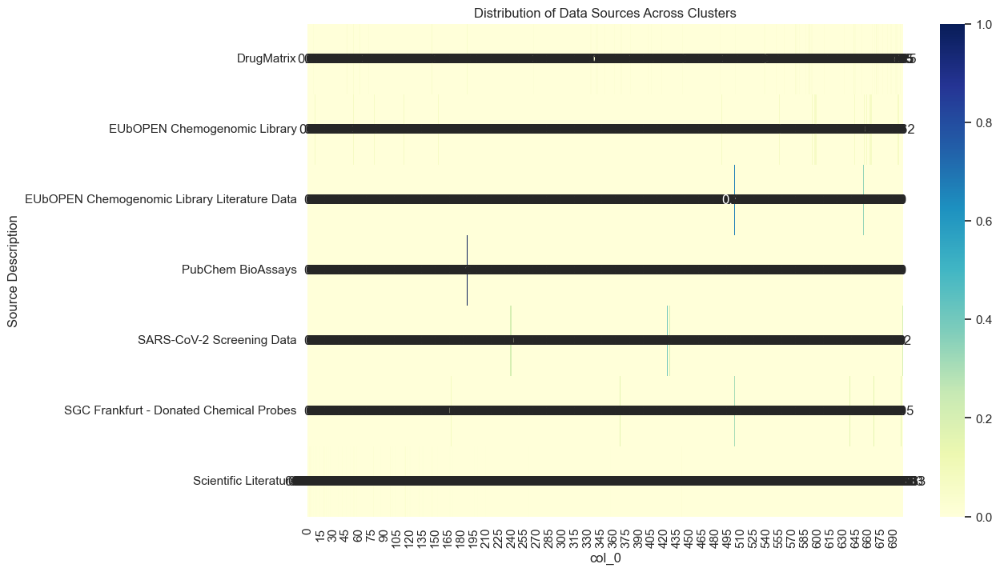

Chi-square test p-value: 0.0000
Significant correlation between clusters and data sources

Average standard deviation per cluster:
Cluster
0       200.709351
1              NaN
2      3318.040994
3      7223.172693
4        98.994949
          ...     
696            NaN
697            NaN
698      74.493699
699            NaN
700            NaN
Name: std, Length: 701, dtype: float64


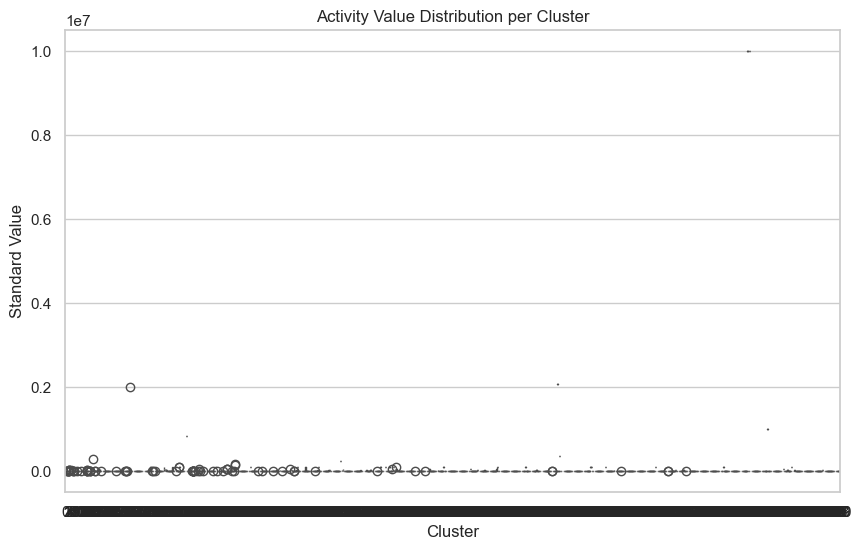


Compounds with high assay variance (>1.0):
                                             Smiles        std_dev
0                             C1COC(C2CN3CCC2CC3)C1    4171.930009
6                               CC(=O)OC1CC2CCCC1N2   10562.486075
7                              CC(=O)OC1CC2CCCC1N2C  197663.420460
8                              CC(=O)OCC[N+](C)(C)C    7377.771586
10      CC(C1=C(CCN(C(C)C)C(C)C)Cc2ccccc21)c1ccccn1    2768.191991
..                                              ...            ...
117                           O=C1CCCN1CC#CCN1CCCC1      11.227441
118  O=C1Cc2cc(CCN3CCN(c4nsc5ccccc45)CC3)c(Cl)cc2N1    3464.823228
119          OCCOCCN1CCN(C2=Nc3ccccc3Sc3ccccc32)CC1     391.912948
120                   c1ccc2c(c1)CC(C1CN3CCC1CC3)O2     269.407684
121                     c1cnc(O[C@@H]2CN3CCC2C3)cn1    2192.031022

[88 rows x 2 columns]


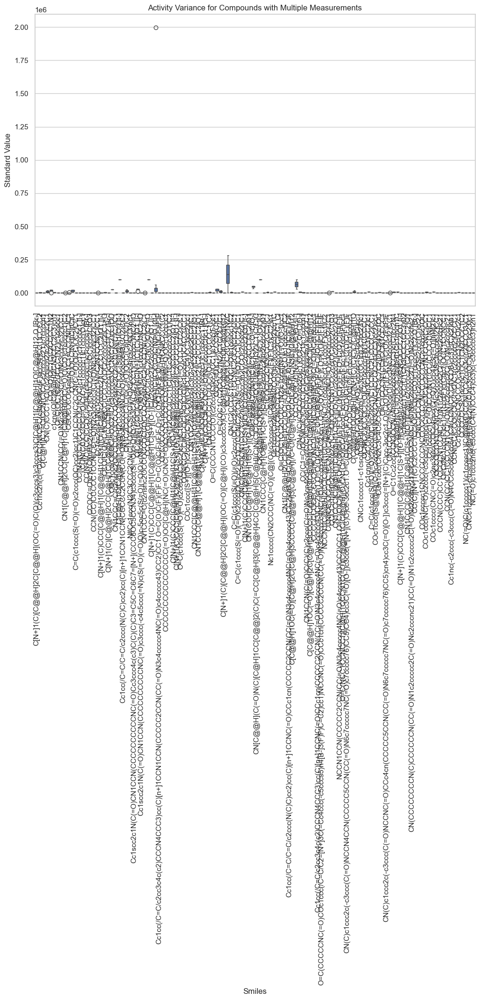


=== Processing dataset: data/cleaned_data/M2.csv ===
Running clustering: scaffold
Running clustering: jarvis-patrick
Running clustering: kmedoids
Running clustering: maxmin
Running clustering: butina
Running clustering: birch

Evaluating clustering with algorithm: scaffold
silhouette_score: 0.2285
adjusted_rand_score: 0.0469
mutual_info_score: 5.1224
normalized_mutual_info_score: 0.8164
homogeneity_score: 0.7827
completeness_score: 0.8532
v_measure_score: 0.8164
silhouette_score: 0.2285
t-SNE plot saved to TSNE_plots/tsne_M2_scaffold.png


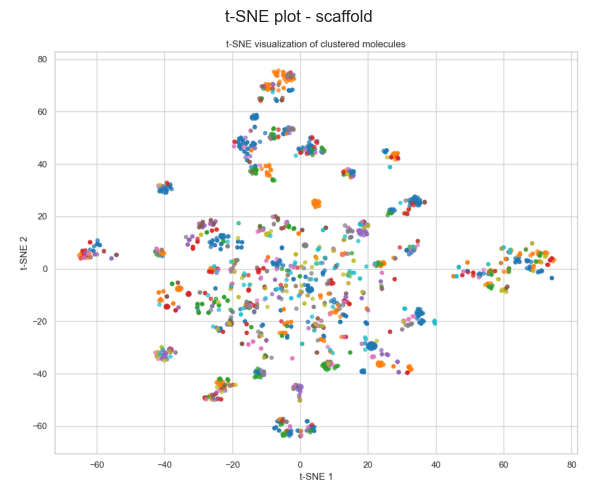

UMAP plot saved to UMAP_plots/umap_M2_scaffold.png


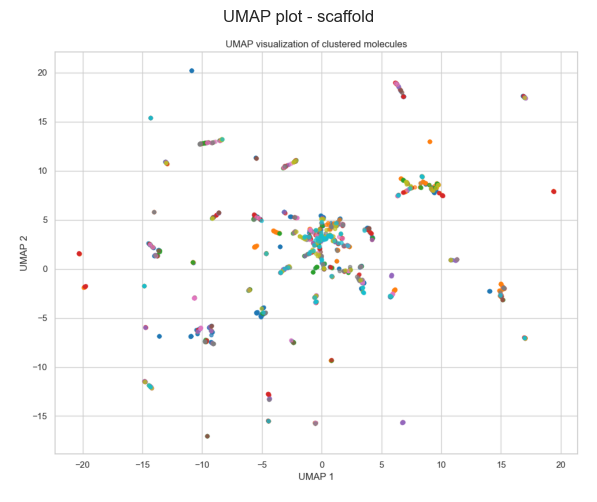


Evaluating clustering with algorithm: jarvis-patrick
silhouette_score: 0.2694
adjusted_rand_score: 0.0339
mutual_info_score: 5.7527
normalized_mutual_info_score: 0.8692
homogeneity_score: 0.8790
completeness_score: 0.8595
v_measure_score: 0.8692
silhouette_score: 0.2694
t-SNE plot saved to TSNE_plots/tsne_M2_jarvis-patrick.png


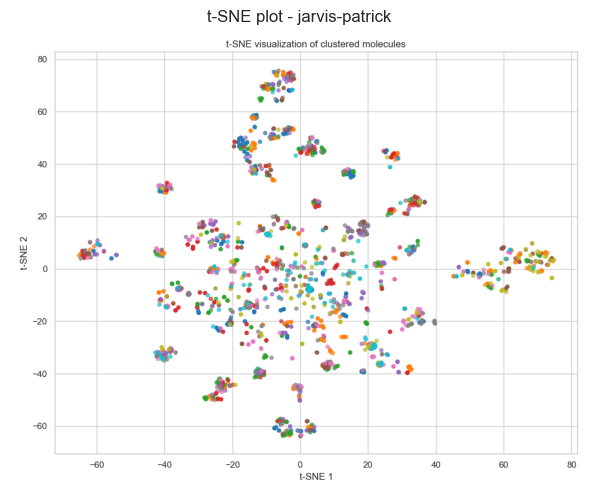

UMAP plot saved to UMAP_plots/umap_M2_jarvis-patrick.png


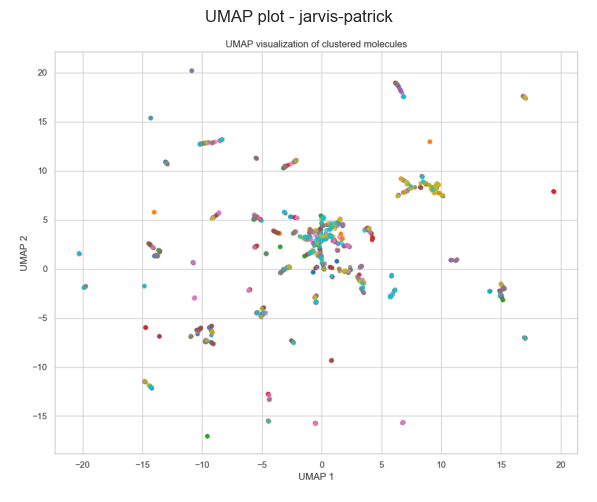


Evaluating clustering with algorithm: kmedoids
silhouette_score: -0.1055
adjusted_rand_score: 0.0000
mutual_info_score: 0.0044
normalized_mutual_info_score: 0.0014
homogeneity_score: 0.0007
completeness_score: 1.0000
v_measure_score: 0.0014
silhouette_score: -0.1055
t-SNE plot saved to TSNE_plots/tsne_M2_kmedoids.png


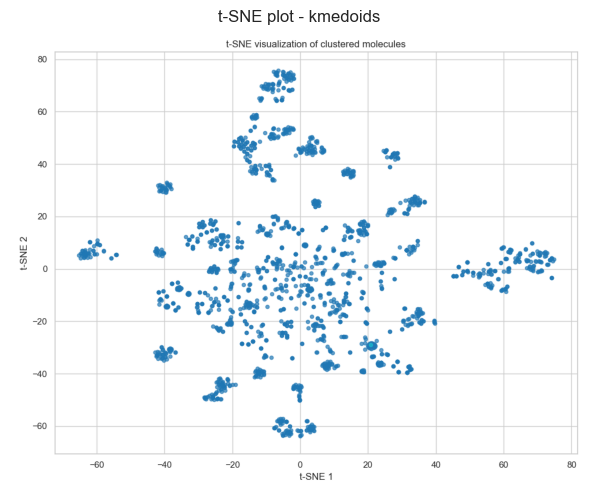

UMAP plot saved to UMAP_plots/umap_M2_kmedoids.png


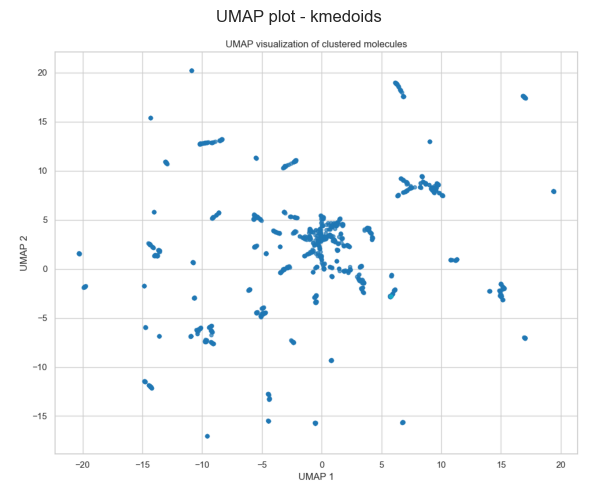


Evaluating clustering with algorithm: maxmin
silhouette_score: 0.0069
adjusted_rand_score: 0.0009
mutual_info_score: 0.5372
normalized_mutual_info_score: 0.1475
homogeneity_score: 0.0821
completeness_score: 0.7261
v_measure_score: 0.1475
silhouette_score: 0.0069
t-SNE plot saved to TSNE_plots/tsne_M2_maxmin.png


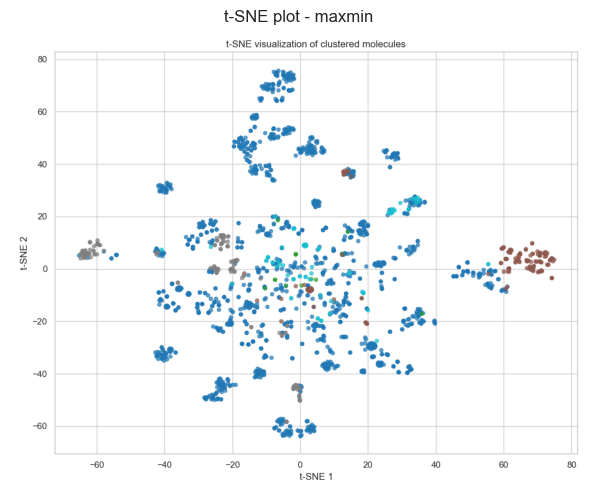

UMAP plot saved to UMAP_plots/umap_M2_maxmin.png


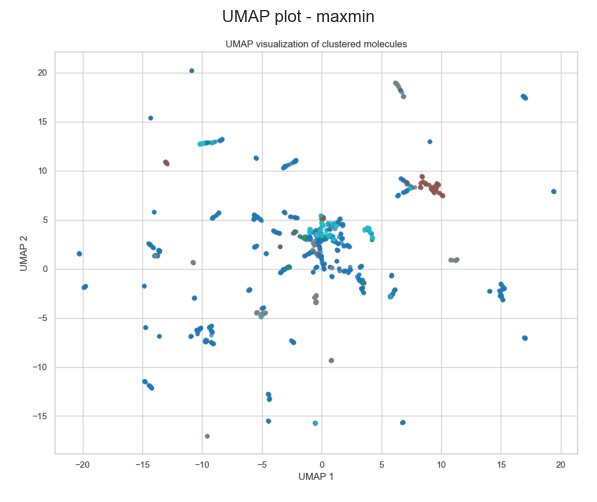


Evaluating clustering with algorithm: butina
silhouette_score: 0.3392
adjusted_rand_score: 0.0368
mutual_info_score: 4.7865
normalized_mutual_info_score: 0.7851
homogeneity_score: 0.7313
completeness_score: 0.8473
v_measure_score: 0.7851
silhouette_score: 0.3392
t-SNE plot saved to TSNE_plots/tsne_M2_butina.png


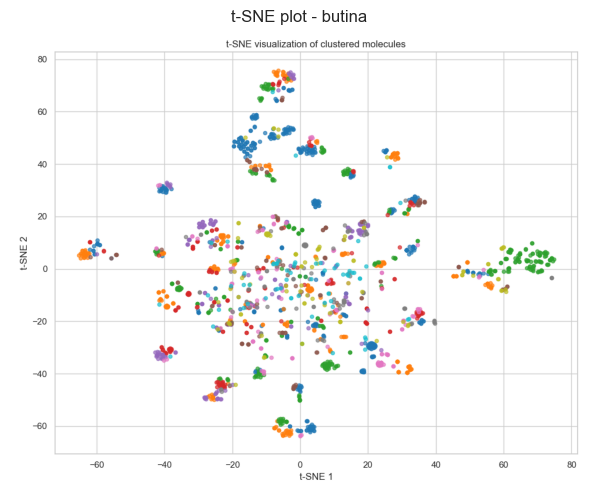

UMAP plot saved to UMAP_plots/umap_M2_butina.png


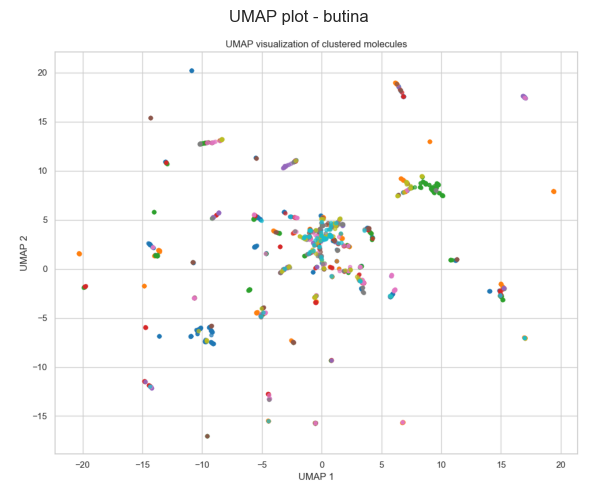


Evaluating clustering with algorithm: birch
silhouette_score: 0.0956
adjusted_rand_score: 0.0049
mutual_info_score: 0.8123
normalized_mutual_info_score: 0.2131
homogeneity_score: 0.1241
completeness_score: 0.7522
v_measure_score: 0.2131
silhouette_score: 0.0956
t-SNE plot saved to TSNE_plots/tsne_M2_birch.png


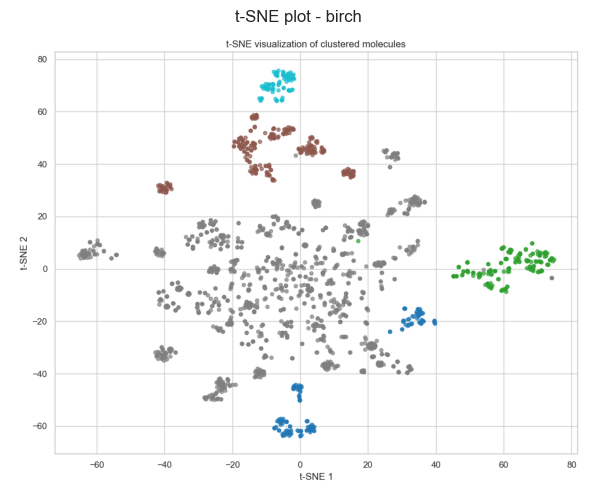

UMAP plot saved to UMAP_plots/umap_M2_birch.png


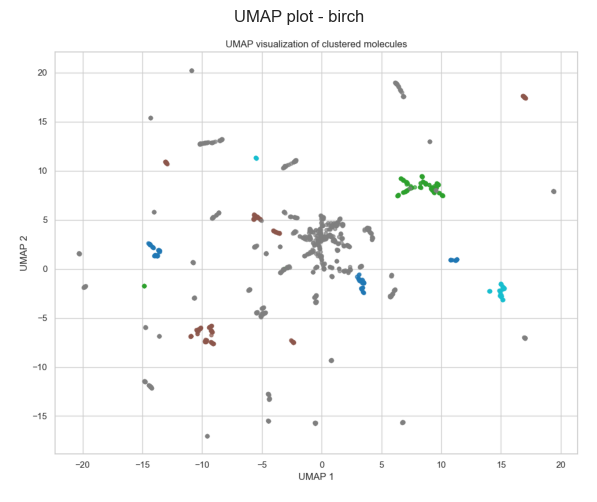


Cluster 0 dominant scaffolds:
  C1=C(Cc2ccccn2)c2ccccc2C1: 1 compounds
  C1=C(Cc2ccccn2)c2ccccc2C1: 1 compounds
  C1=C(Cc2ccccn2)c2ccccc2C1: 1 compounds

Cluster 1 dominant scaffolds:
  C1=Cc2ccccc2/C1=C/c1ccccn1: 1 compounds
  C1=Cc2ccccc2/C1=C/c1ccccn1: 1 compounds
  C1=Cc2ccccc2/C1=C/c1ccccn1: 1 compounds

Cluster 2 dominant scaffolds:
  O=C(C(c1ccccc1)C1CCCC1)N1CCCCC1: 1 compounds
  O=C(C(c1ccccc1)C1CCCC1)N1CCCCC1: 1 compounds
  O=C(C(c1ccccc1)C1CCCC1)N1CCCCC1: 1 compounds

Cluster 3 dominant scaffolds:
  c1cc(C2(C3CCN(C4CCNCC4)CC3)OCCO2)ccc1[SH+]c1ccc2c(c1)OCO2: 1 compounds
  c1cc(C2(C3CCN(C4CCNCC4)CC3)OCCO2)ccc1[SH+]c1ccc2c(c1)OCO2: 1 compounds

Cluster 4 dominant scaffolds:
  O=C(c1ccccc1)N1CCC(N2CCC(Cc3ccc(S(=O)(=O)c4ccccc4)cc3)CC2)CC1: 1 compounds
  O=C(c1ccccc1)N1CCC(N2CCC(Cc3ccc(S(=O)(=O)c4ccccc4)cc3)CC2)CC1: 1 compounds
  O=C(c1ccccc1)N1CCC(N2CCC(Cc3ccc(S(=O)(=O)c4ccccc4)cc3)CC2)CC1: 1 compounds

Cluster 5 dominant scaffolds:
  c1cnc(O[C@@H]2CN3CCC2C3)cn1: 1 compounds
  c1

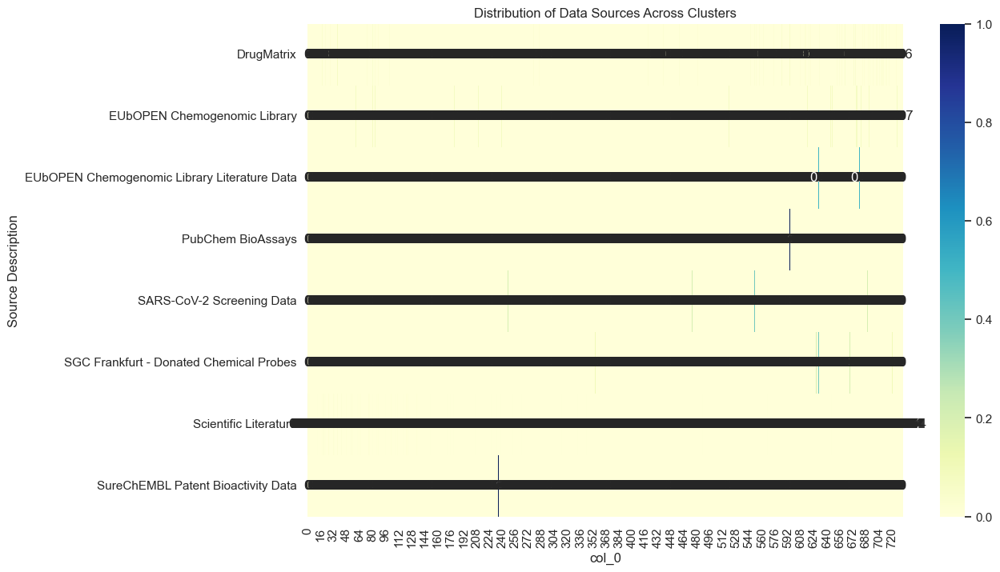

Chi-square test p-value: 0.0000
Significant correlation between clusters and data sources

Average standard deviation per cluster:
Cluster
0       2963.015204
1      15297.127545
2       4042.269657
3          5.845652
4          1.762464
           ...     
729             NaN
730             NaN
731             NaN
732             NaN
733             NaN
Name: std, Length: 734, dtype: float64


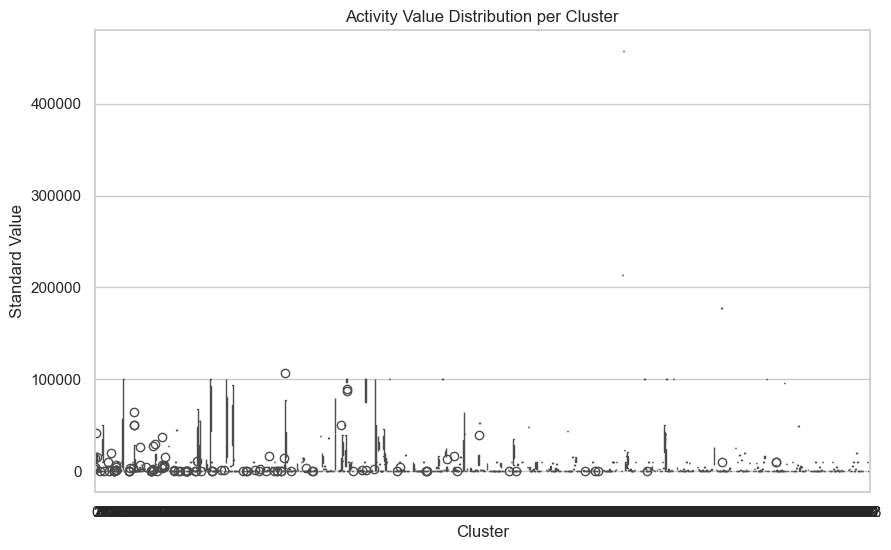


Compounds with high assay variance (>1.0):
                                                Smiles       std_dev
0                                C1COC(C2CN3CCC2CC3)C1  10606.601718
22   CC(=C1CCN(C2CCN(C(=O)c3cccc(C)c3N)CC2)CC1)c1cc...      5.332545
25   CC(=O)N[C@@H](CCCN)C(=O)NC(=O)[C@H](C)NC(=O)[C...     18.940819
27   CC(=O)N[C@@H](CCCN)C(=O)NC(=O)[C@H](C)NC(=O)[C...     25.604337
28                                 CC(=O)OC1CC2CCCC1N2      2.195046
..                                                 ...           ...
150                         O=C(OC1CC2CCCC1N2)c1ccccc1    989.949494
152                              O=C1CCCN1CC#CCN1CCCC1   4140.529434
157             OCCOCCN1CCN(C2=Nc3ccccc3Sc3ccccc32)CC1    133.784603
158                      c1ccc2c(c1)CC(C1CN3CCC1CC3)O2    947.523087
159  c1ccc2oc(-c3csc(C4CCN(Cc5nc6ncccc6[nH]5)CC4)n3...    743.862192

[92 rows x 2 columns]


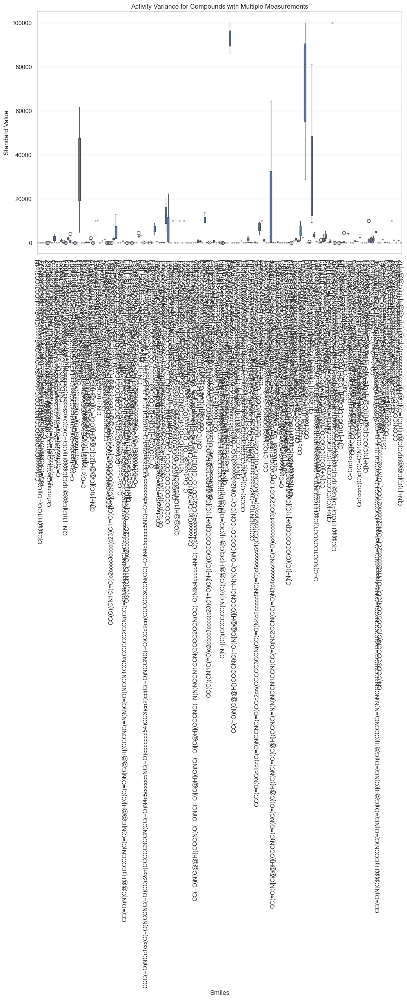


=== Processing dataset: data/cleaned_data/α1A.csv ===
Running clustering: scaffold
Running clustering: jarvis-patrick
Running clustering: kmedoids
Running clustering: maxmin
Running clustering: butina
Running clustering: birch

Evaluating clustering with algorithm: scaffold
silhouette_score: 0.2381
adjusted_rand_score: 0.0586
mutual_info_score: 4.6787
normalized_mutual_info_score: 0.7822
homogeneity_score: 0.7419
completeness_score: 0.8272
v_measure_score: 0.7822
silhouette_score: 0.2381
t-SNE plot saved to TSNE_plots/tsne_α1A_scaffold.png


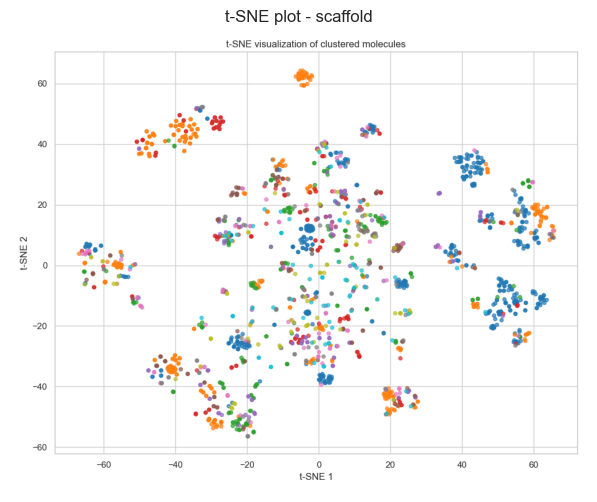

UMAP plot saved to UMAP_plots/umap_α1A_scaffold.png


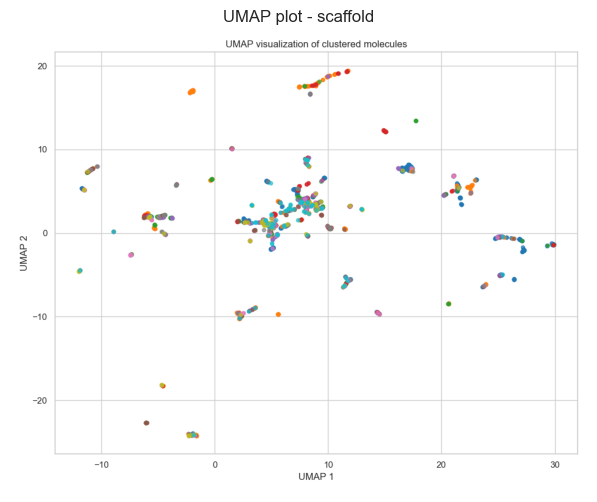


Evaluating clustering with algorithm: jarvis-patrick
silhouette_score: 0.2879
adjusted_rand_score: 0.0568
mutual_info_score: 5.5729
normalized_mutual_info_score: 0.8565
homogeneity_score: 0.8836
completeness_score: 0.8310
v_measure_score: 0.8565
silhouette_score: 0.2879
t-SNE plot saved to TSNE_plots/tsne_α1A_jarvis-patrick.png


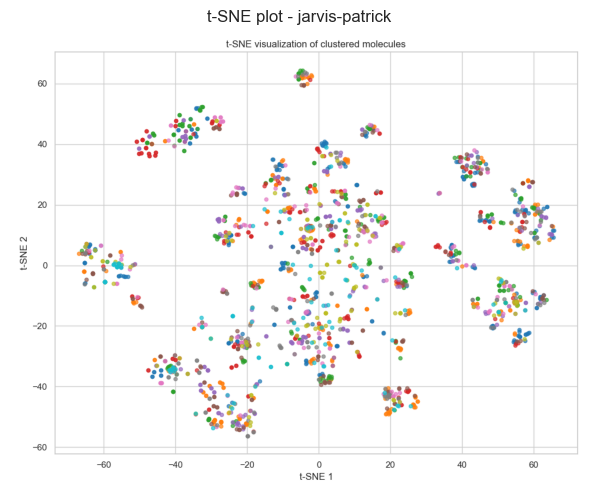

KeyboardInterrupt: 

In [106]:
from utils.analyze import analyze_assay_consistency, analyze_source_distribution, analyze_structural_clusters
os.makedirs("TSNE_plots", exist_ok=True)
os.makedirs("UMAP_plots", exist_ok=True)


best_algo = "scaffold"

metrics = [
    "silhouette_score", "adjusted_rand_score", "mutual_info_score",
    "normalized_mutual_info_score", "homogeneity_score",
    "completeness_score", "v_measure_score"
]

evaluation_results = []  # Collect results for all datasets and algorithms

for dataset_path in dataset_files:
    if dataset_path == "data/cleaned_data/D2.csv":
        continue
    print(f"\n=== Processing dataset: {dataset_path} ===")
    smiles, true_labels = load_smiles_and_labels(dataset_path)
    
    all_cluster_labels = run_clustering(
        smiles_list=smiles,
        clusterer_names=None,
        n_clusters=5,
        fp_type="morgan",
        random_state=42,
        neighbor_k=5,
        min_shared=3
    )

    transformer = FingerprintTransformer(fp_type="morgan", n_bits=2048)
    features = transformer.fit_transform(smiles)

    for algo_name, labels in all_cluster_labels.items():
        if labels is None:
            print(f"Skipping evaluation and plots for {algo_name} due to failure.")
            continue

        print(f"\nEvaluating clustering with algorithm: {algo_name}")
        for metric_name in metrics + ["silhouette_score"]:
            try:
                score = evaluate_clustering(
                    dataset_path,
                    labels,
                    metric=metric_name,
                    feature_matrix=features  # Only used for silhouette
                )
                print(f"{metric_name}: {score:.4f}")
                evaluation_results.append({
                    "Dataset": os.path.basename(dataset_path),
                    "Algorithm": algo_name,
                    "Metric": metric_name,
                    "Score": score
                })
            except Exception as e:
                print(f"Error computing {metric_name} for {algo_name}: {e}")


        try:
            tsne_save_path = f"TSNE_plots/tsne_{os.path.basename(dataset_path).replace('.csv','')}_{algo_name}.png"
            create_tsne.generate_tsne(dataset_path, labels, save_path=tsne_save_path)
            img = plt.imread(tsne_save_path)
            plt.figure(figsize=(8,6))
            plt.imshow(img)
            plt.axis('off')
            plt.title(f"t-SNE plot - {algo_name}")
            plt.show()
        except Exception as e:
            print(f"Failed to generate t-SNE for {algo_name}: {e}")

        try:
            umap_save_path = f"UMAP_plots/umap_{os.path.basename(dataset_path).replace('.csv','')}_{algo_name}.png"
            create_umap.generate_umap(dataset_path, labels, save_path=umap_save_path)
            img = plt.imread(umap_save_path)
            plt.figure(figsize=(8,6))
            plt.imshow(img)
            plt.axis('off')
            plt.title(f"UMAP plot - {algo_name}")
            plt.show()
        except Exception as e:
            print(f"Failed to generate UMAP for {algo_name}: {e}")
    
    df = pd.read_csv(dataset_path)
    cluster_labels = all_cluster_labels[best_algo]
    analyze_structural_clusters(df, cluster_labels)
    analyze_source_distribution(df, cluster_labels)
    analyze_assay_consistency(df, cluster_labels)


# 5. Prepare results

In [ ]:
results_df = pd.DataFrame(evaluation_results)

pivot_table = results_df.pivot_table(
    index=["Dataset", "Algorithm"],
    columns="Metric",
    values="Score"
)

pivot_table.head()


# 6. Visualize Results as Heatmap

In [ ]:
plt.figure(figsize=(16, 10))
sns.heatmap(pivot_table, annot=True, fmt=".2f", cmap="coolwarm")
plt.title("Clustering Metrics per Dataset and Algorithm")
plt.tight_layout()
plt.show()


7. # t-SNE & UMAP plots

In [ ]:
# os.makedirs("plots", exist_ok=True)
#
# for dataset_path in dataset_files:
#     name = os.path.basename(dataset_path).replace(".csv", "")
#     smiles, _ = load_smiles_and_labels(dataset_path)
#     features = smiles_to_fingerprints(smiles)
#
#     try:
#         labels = KMeans(n_clusters=5, random_state=42).fit_predict(features)
#     except Exception as e:
#         print(f"Failed to cluster {name} with KMeans: {e}")
#         continue
#
#     print(f"Generating plots for {name}...")
#
#     try:
#         tsne_path = f"plots/{name}_tsne.png"
#         create_tsne.generate_tsne(dataset_path, labels=labels, save_path=tsne_path, metrics_info="KMeans Clustering")
#         img = plt.imread(tsne_path)
#         plt.figure(figsize=(8, 6))
#         plt.imshow(img)
#         plt.axis('off')
#         plt.title(f"t-SNE - {name}")
#         plt.show()
#     except Exception as e:
#         print(f"Failed t-SNE for {name}: {e}")
#
#     try:
#         umap_path = f"plots/{name}_umap.png"
#         create_umap.generate_umap(dataset_path, labels=labels, save_path=umap_path, metrics_info="KMeans Clustering")
#         img = plt.imread(umap_path)
#         plt.figure(figsize=(8, 6))
#         plt.imshow(img)
#         plt.axis('off')
#         plt.title(f"UMAP - {name}")
#         plt.show()
#     except Exception as e:
#         print(f"Failed UMAP for {name}: {e}")


# 8. Summary

In [ ]:
summary_table = results_df.groupby(["Algorithm", "Metric"])["Score"].mean().unstack().round(3)

print("Average Scores per Algorithm:")
display(summary_table)

summary_table.to_csv("clustering_summary.csv")

In [ ]:
import pandas as pd
data_dir = "data/raw"
dataset_files = sorted(glob.glob(os.path.join(data_dir, "*.csv")))

print(f"Found {len(dataset_files)} datasets")

best_algo = "kmedoids"

for dataset_file in dataset_files:
    df = pd.read_csv(dataset_file)
    cluster_labels = all_cluster_labels[best_algo]
    analyze_structural_clusters(df, cluster_labels)
    analyze_source_distribution(df, cluster_labels)
    analyze_assay_consistency(df, cluster_labels)